### Background:

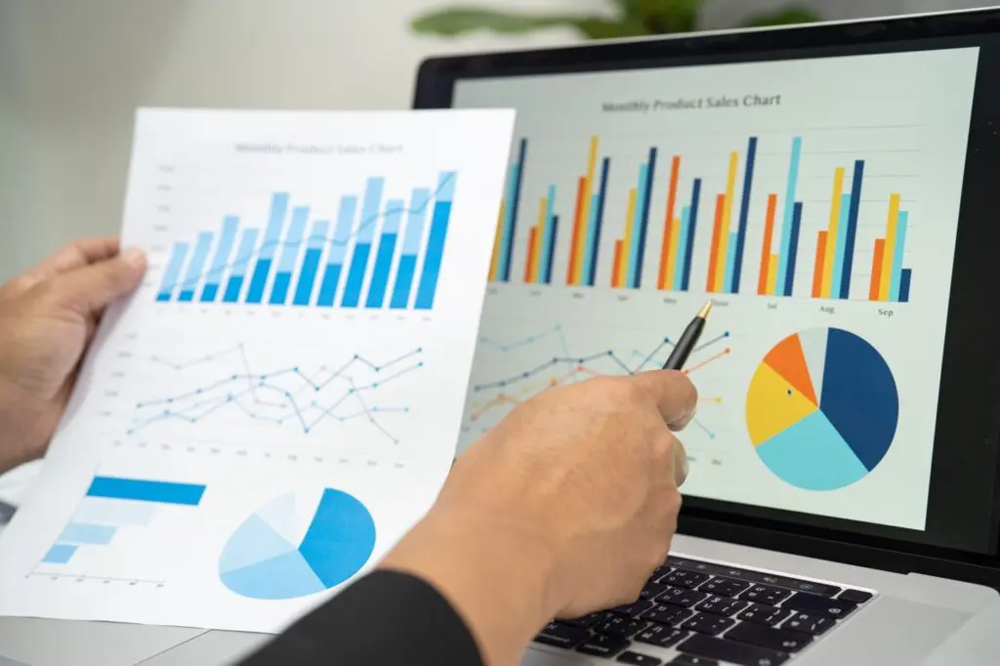

The goal of this Project is to try and gain some insights on a random dataset. This dataset contains sales data for a pharmaceutical company. The goal is to see if we can identify and trends in the sales of each product based on seasonality and time. Since this dataset contains sales data over a period of time, it only makes sense to use time-series forecasting techniques. In this project, we will use these techniques along with data transformations and basic machine learning algorithms to evaluate the performance. Although we will try multiple machine learning algorithms, I may cut down the number we show here to 2 for conciseness.

Sources: https://www.google.com/url?sa=i&url=https%3A%2F%2Fmyhfa.org%2F3-steps-to-effectively-analyze-sales-data%2F&psig=AOvVaw3br4Si2loqRX1Z7Kjh29uA&ust=1743513512972000&source=images&cd=vfe&opi=89978449&ved=0CBQQjRxqFwoTCOCQ8ZC0tIwDFQAAAAAdAAAAABAE

In [1]:
!pip install -r requirements.txt

Defaulting to user installation because normal site-packages is not writeable


In [2]:
# Lets read in our csv files
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Read the csv file into a pandas dataframe
df_salesdaily = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\salesdaily.csv")
df_saleshourly = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\saleshourly.csv")
df_salesmonthly = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\salesmonthly.csv")
df_salesweekly = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\salesweekly.csv")

#Lets take it one at a time. Let's look at monthly sales data first since we can better identify trends.
df_salesmonthly['datum'] = pd.to_datetime(df_salesmonthly['datum'])
print(df_salesmonthly.dtypes)
print(df_salesmonthly.head())

datum    datetime64[ns]
M01AB           float64
M01AE           float64
N02BA           float64
N02BE           float64
N05B            float64
N05C            float64
R03             float64
R06             float64
dtype: object
       datum   M01AB    M01AE    N02BA     N02BE   N05B  N05C    R03    R06
0 2014-01-31  127.69   99.090  152.100   878.030  354.0  50.0  112.0   48.2
1 2014-02-28  133.32  126.050  177.000  1001.900  347.0  31.0  122.0   36.2
2 2014-03-31  137.44   92.950  147.655   779.275  232.0  20.0  112.0   85.4
3 2014-04-30  113.10   89.475  130.900   698.500  209.0  18.0   97.0   73.7
4 2014-05-31  101.79  119.933  132.100   628.780  270.0  23.0  107.0  123.7


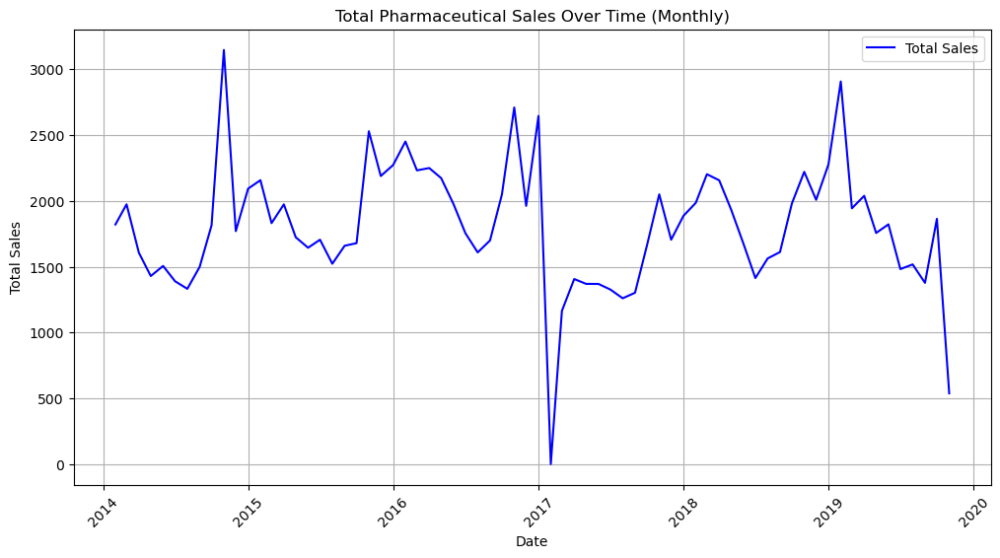

In [3]:
#Lets find the Total Sales for each month to see if we can find some trends in the data.
#We're using monthly totals for a cleaner and more readable graph.
drugs_columns = ["M01AB", "M01AE" , "N02BA", "N02BE", "N05B", "N05C", "R03", "R06"]

df_salesmonthly['Total Sales'] = df_salesmonthly[drugs_columns].sum(axis=1)

plt.figure(figsize=(12, 6))
plt.plot(df_salesmonthly["datum"], df_salesmonthly["Total Sales"], linestyle='-', color='b', label="Total Sales")

plt.xlabel("Date")
plt.ylabel("Total Sales")
plt.title("Total Pharmaceutical Sales Over Time (Monthly)")
plt.xticks(rotation=45)
plt.legend()
plt.grid()

plt.show()

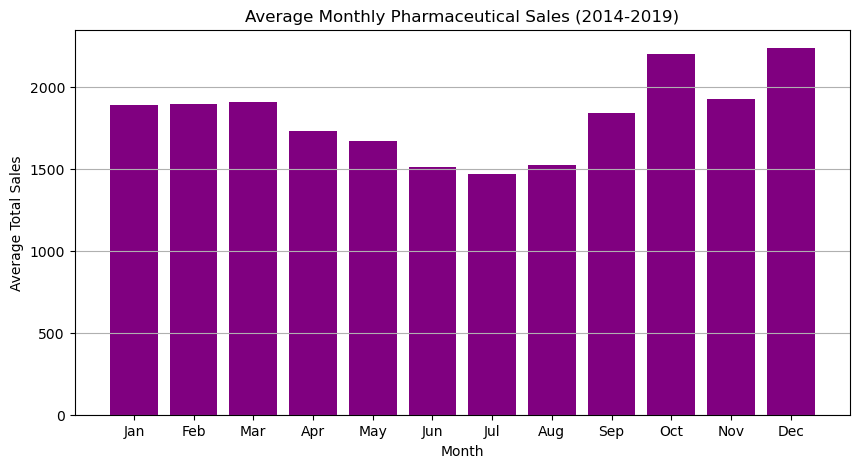

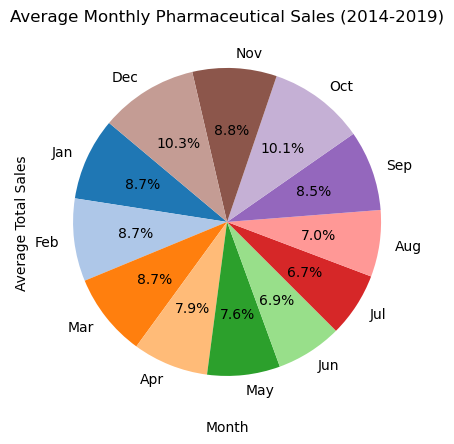

In [4]:
df_salesmonthly["Month"] = df_salesmonthly["datum"].dt.month
df_salesmonthly["Total Sales"] = df_salesmonthly[drugs_columns].sum(axis=1)

monthly_avg_sales = df_salesmonthly.groupby("Month")["Total Sales"].mean()
months_labels = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

#Creating a Bar plot
plt.figure(figsize=(10, 5))
plt.bar(months_labels, monthly_avg_sales, color="purple")

plt.xlabel("Month")
plt.ylabel("Average Total Sales")
plt.title("Average Monthly Pharmaceutical Sales (2014-2019)")
plt.grid(axis="y") #only horizontal grid lines
plt.show()

#Creating a Pie Chart to visualize the same data
plt.figure(figsize=(10, 5))
plt.pie(monthly_avg_sales, labels=months_labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.tab20.colors)

plt.xlabel("Month")
plt.ylabel("Average Total Sales")
plt.title("Average Monthly Pharmaceutical Sales (2014-2019)")

plt.show()


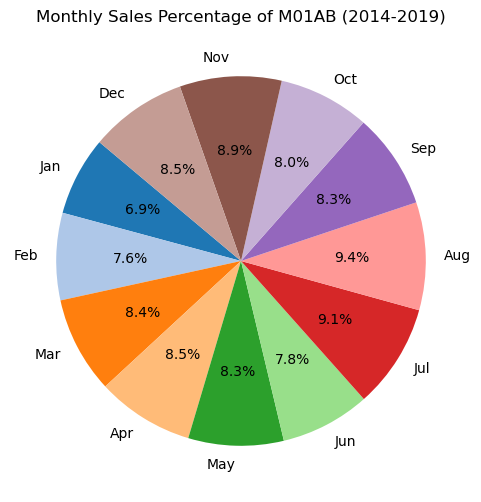

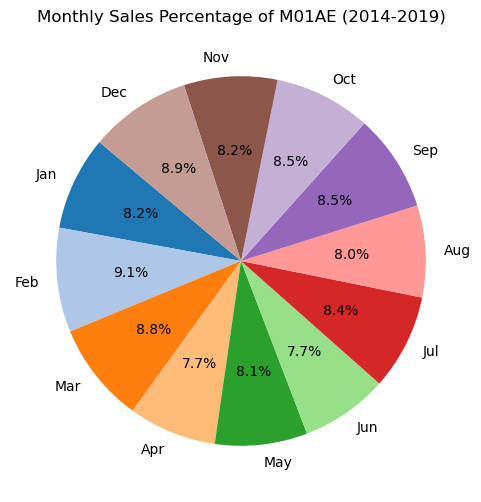

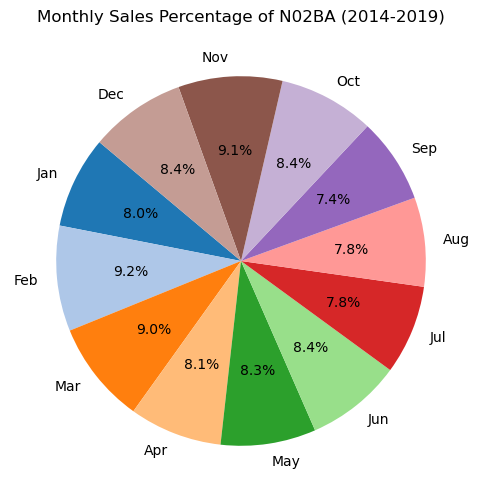

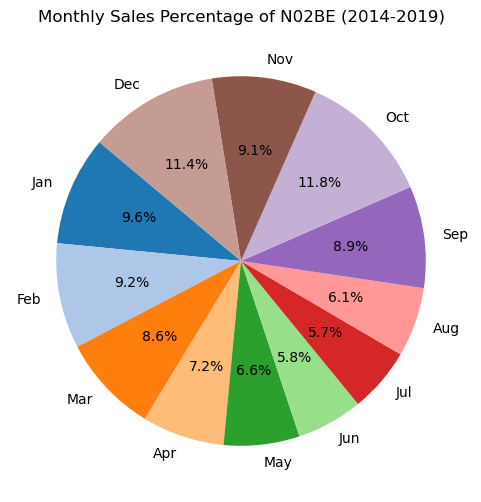

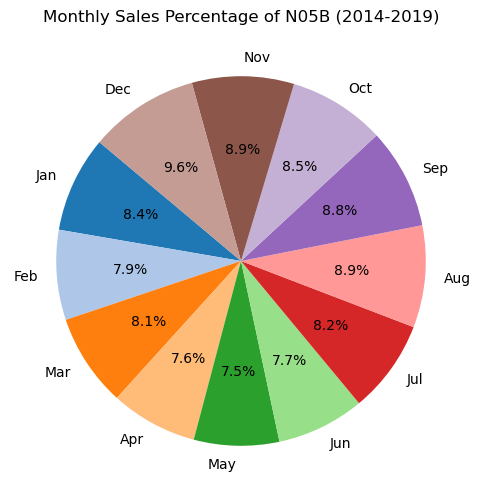

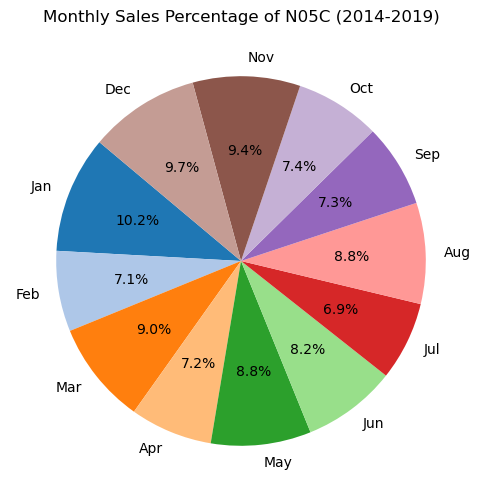

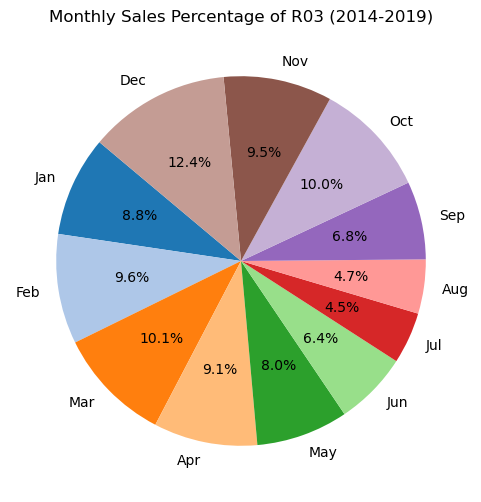

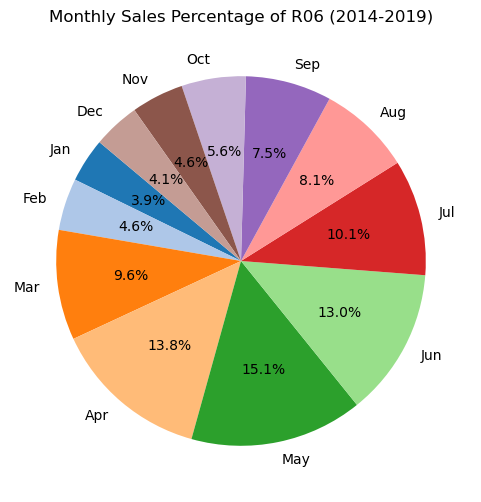

In [5]:
#Building a Pie Chart to visualize the monthly sales data for every drug.
for drug in drugs_columns:
    monthly_sales = df_salesmonthly.groupby("Month")[drug].mean()
    monthly_sales_percentage = (monthly_sales / monthly_sales.sum()) * 100
    plt.figure(figsize=(6, 6))
    plt.pie(monthly_sales_percentage, labels=months_labels, autopct='%1.1f%%', startangle=140, colors=plt.cm.tab20.colors)
    
    plt.title("Monthly Sales Percentage of " + drug + " (2014-2019)")
    plt.show()

### Quick Notes:
These pie charts `above` show the percentage of sales for each month that the drug sells in a year. For example if we take a look at R06 in the pie chart above, We can see that 15.1% of sales for R06 happen in the month of May. This may give us some insight for our Marketing team. If the administrative team decides that we want to promote the sale of R06, for example, the best time to do so would be in the months of April, May, and June. We also have a better understand of what months we may need more inventory for a particular drug.

In [6]:
top_products_monthly = {}

# Going through each month and collecting the top 3 products in terms of expected sales
for month in range(1, 13):
    # Filter the expected sales for the current month
    monthly_sales = df_salesmonthly[df_salesmonthly["Month"] == month][drugs_columns].mean()

    top_products = monthly_sales.sort_values(ascending=False).head(3)

    top_products_monthly[month] = top_products.index.tolist()

#Outputing the top three products for each month
for month, products in top_products_monthly.items():
    print(f"Month {month}: Top 3 Products: {products}")

Month 1: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 2: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 3: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 4: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 5: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 6: Top 3 Products: ['N02BE', 'N05B', 'M01AB']
Month 7: Top 3 Products: ['N02BE', 'N05B', 'M01AB']
Month 8: Top 3 Products: ['N02BE', 'N05B', 'M01AB']
Month 9: Top 3 Products: ['N02BE', 'N05B', 'M01AB']
Month 10: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 11: Top 3 Products: ['N02BE', 'N05B', 'R03']
Month 12: Top 3 Products: ['N02BE', 'N05B', 'R03']


In [7]:
drugs_columns = ["M01AB", "M01AE", "N02BA", "N02BE", "N05B", "N05C", "R03", "R06"]

monthly_sales = df_salesmonthly.groupby("Month")[drugs_columns].sum()

monthly_sales_percentage = (monthly_sales.T / monthly_sales.sum(axis=1)).T * 100

display(monthly_sales_percentage)

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06
Month,,,,,,,,
1,6.598175,6.089627,5.884873,54.689986,14.041750,1.165584,9.432838,2.097167
2,7.264732,6.746487,6.738435,52.532357,13.130116,0.801691,10.316268,2.469914
3,7.990918,6.462196,6.497120,48.694161,13.446328,1.014553,10.714031,5.180693
4,8.867921,6.220617,6.487079,44.866578,13.855915,0.895234,10.656175,8.150482
5,9.018702,6.791776,6.915082,42.902641,14.125520,1.130602,9.805220,9.310457
6,9.351897,7.077010,7.666449,41.273994,16.033524,1.168078,8.628350,8.800697
7,11.213265,7.972968,7.357112,41.578526,17.528072,1.010623,6.245426,7.094009
8,11.142987,7.366936,7.067705,42.935431,18.468375,1.245796,6.305475,5.467295
9,8.152436,6.466476,5.586655,52.171099,15.051889,0.850645,7.529112,4.191688


In [8]:
ranked_months_df = monthly_sales_percentage.apply(lambda x: x.sort_values(ascending=False).index, axis=0)

ranked_months_df.index = [f"Rank {i+1}" for i in range(12)]

print(ranked_months_df)

         M01AB  M01AE  N02BA  N02BE  N05B  N05C  R03  R06
Rank 1       7      7      6     10     8     8   12    5
Rank 2       8      8      7     12     7     6    3    6
Rank 3       6      6      8      1     6     1    4    4
Rank 4       5      5      5      2     9     5    2    7
Rank 5       4      2      2      9    11    11   11    8
Rank 6      11      9     11     11     5     3    5    3
Rank 7       9      3      3      3     1     7    1    9
Rank 8       3      4      4      4     4    12   10   10
Rank 9       2      1      1      8    12     4    6    2
Rank 10     12     11      9      5     3     9    9   11
Rank 11      1     12     10      7     2     2    8    1
Rank 12     10     10     12      6    10    10    7   12


In [9]:
top_products_per_month = monthly_sales_percentage.apply(lambda x: x.sort_values(ascending=False).index[:3].tolist(), axis=1)

top_products_df = pd.DataFrame(top_products_per_month.tolist(), index=top_products_per_month.index, columns=["Top 1", "Top 2", "Top 3"])

print(top_products_df)

       Top 1 Top 2  Top 3
Month                    
1      N02BE  N05B    R03
2      N02BE  N05B    R03
3      N02BE  N05B    R03
4      N02BE  N05B    R03
5      N02BE  N05B    R03
6      N02BE  N05B  M01AB
7      N02BE  N05B  M01AB
8      N02BE  N05B  M01AB
9      N02BE  N05B  M01AB
10     N02BE  N05B    R03
11     N02BE  N05B    R03
12     N02BE  N05B    R03


In [10]:
#Here we are calculating the Coefficient of variation for each product.
cv_per_product = df_salesmonthly[drugs_columns].std() / df_salesmonthly[drugs_columns].mean()

stability_products = cv_per_product[cv_per_product < 0.3].index.tolist()  # Low variation (<30%)
growth_products = cv_per_product[cv_per_product >= 0.3].index.tolist()  # High variation (>=30%)

print(f"Stable Products: {stability_products}")
print(f"High Variable Products: {growth_products}")


Stable Products: ['M01AB', 'M01AE', 'N02BA']
High Variable Products: ['N02BE', 'N05B', 'N05C', 'R03', 'R06']


In [11]:
for product, cv in cv_per_product.items():
    print(f"Product: {product}, Coefficient of Variation: {cv:.2f}")

Product: M01AB, Coefficient of Variation: 0.21
Product: M01AE, Coefficient of Variation: 0.24
Product: N02BA, Coefficient of Variation: 0.27
Product: N02BE, Coefficient of Variation: 0.38
Product: N05B, Coefficient of Variation: 0.32
Product: N05C, Coefficient of Variation: 0.48
Product: R03, Coefficient of Variation: 0.49
Product: R06, Coefficient of Variation: 0.53


### Quick Notes:
`Above` we are calculating the coefficient of variation for each product. Since the coefficient of variation can help determine the volatility in a particular set of data, this can help us understand the stability of each product and help us rank which products are more stable and which ones are more volatile. We calculate this by dividing the standard deviation by the mean for each product. A lower coefficient of variation indicates a more stable product, while a higher coefficient of variation indicates more variability in sales. This can help us determine the level of "risk" for each product. We can then weigh theses risks along with the revenue potential and help us determine if the product is worth investing more money into. (ie. promoting the product for example.)

Formula for Coefficient of Variation:

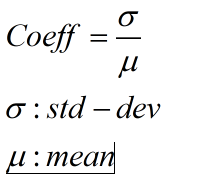

In our case I set the thresholds for low/high variation at 30%, meaning anything below 30% would be a more stable product while anything over would be considered less stable. This value can be changed depending on what strategy upper management may want. This is just one variable to consider.

### Quick Notes:
In this step `below` we are applying a simple linear regression to understand the gross general trends for each product. This is not necessarily meant to completely fit the data but just understand the general trend. In our case we are using a machine learning model via sklearn to help fit this.

In [12]:
df_salesmonthly_fixed = df_salesmonthly.groupby("Month")[drugs_columns].sum()

from sklearn.linear_model import LinearRegression
import numpy as np

# Function to calculate sales trend using Scikit-Learn
def calculate_trend_sklearn(product_sales):
    months = np.array(range(1, 13)).reshape(-1, 1)  # Reshape to column vector
    product_sales = np.array(product_sales).reshape(-1, 1)  # Ensure it's also a column vector
    model = LinearRegression()
    model.fit(months, product_sales)  # Fit the regression model
    return model.coef_[0][0]  # Return the slope (rate of change in sales)

# Apply trend calculation to each product (now fixed)
sales_trends = df_salesmonthly_fixed.apply(calculate_trend_sklearn, axis=0)

# Identify growth and declining products
growing_products = sales_trends[sales_trends > 0].index.tolist()  # Increasing trend
declining_products = sales_trends[sales_trends < 0].index.tolist()  # Decreasing trend

# Display results
print(f"Trending Growth Products: {growing_products}")
print(f"Trending Decline Products: {declining_products}")
print("Sales Trends (Slope per Product):")
print(sales_trends)

Trending Growth Products: ['M01AB', 'N02BE', 'N05B']
Trending Decline Products: ['M01AE', 'N02BA', 'N05C', 'R03', 'R06']
Sales Trends (Slope per Product):
M01AB     0.264196
M01AE    -8.059895
N02BA   -10.374549
N02BE    30.951780
N05B      3.286364
N05C     -1.283217
R03      -9.152972
R06     -20.308182
dtype: float64


### Quick Notes:
`Above` We can see that N02BE seems to have the highest increasing growth rate from all of the products we have data for. We can also see that R06 has the highest decreasing growth rate from all of the products we have data for. In addition, R06 has a very high Coefficient of variation meaning that it is a highly unstable product in terms of sales, therefore it is a far more "risky" product with a low revenue potential due it's highly decreasing growth. This may indicate that this product may not give us the best ROI on some investment and therefore we should heavily de-prioritize marketing and development product and consider keeping a lower inventory. While I don't think we should go so far as to say the company should completely eliminate this product from their catalog, the company should prioritize using the sales data for inventory purposes rather than promotional. There may be an exception for this product in the summer months as a majority of it's sales happen during that time. We can also consider altering our sales and inventory strategies to account for this.

We can also see that N02BE has the highest growth rate from all of the products we have data for. It is important to note, however, that N02BE still does have a higher coefficient of variation meaning that it's stability still puts the value of its investment into question. If we were to invest into this product, it would be more of a "high risk-high return" value investment. We need to understand how this product has done historically to get a better picture of what we should do with it.

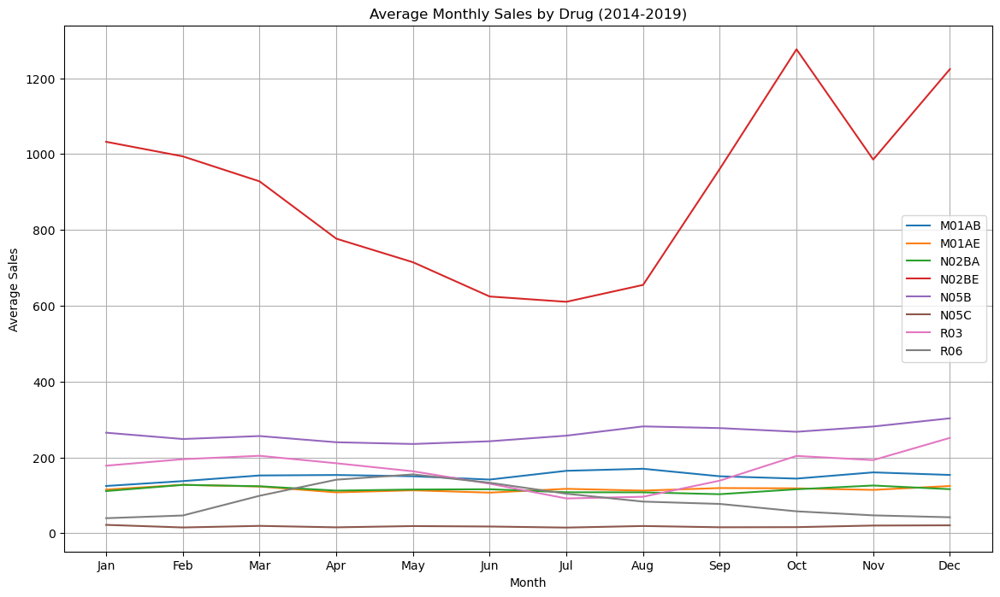

In [13]:
df_salesmonthly["Month"] = df_salesmonthly["datum"].dt.month
df_salesmonthly["Year"] = df_salesmonthly["datum"].dt.year

monthly_avg_by_drug = df_salesmonthly.groupby("Month")[drugs_columns].mean()

plt.figure(figsize=(14, 8))

for drug in drugs_columns:
    plt.plot(monthly_avg_by_drug.index, monthly_avg_by_drug[drug], label=drug)
plt.title("Average Monthly Sales by Drug (2014-2019)")
plt.xlabel("Month")
plt.ylabel("Average Sales")
plt.xticks(monthly_avg_by_drug.index, ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"])
plt.legend()
plt.grid()
plt.show()

In [14]:
yoy_sales = df_salesmonthly.groupby("Year")[drugs_columns].sum()
yoy_growth = yoy_sales.pct_change() * 100 # Calculating Year-over-Year growth, this is the percentage change of sales from one year to the next.

print(yoy_sales)
print(yoy_growth)

        M01AB     M01AE     N02BA      N02BE    N05B   N05C      R03      R06
Year                                                                         
2014  1510.77  1333.594  1683.279  10094.555  4355.0  303.0  1277.00   828.30
2015  1905.62  1496.603  1608.630  11997.350  2965.0  159.0  1776.25   983.03
2016  2125.06  1604.441  1664.800  13435.830  3278.5  207.0  2137.00  1065.07
2017  1653.79  1214.485  1091.150   7674.919  2078.0  142.0  1732.00   919.61
2018  1786.93  1389.656  1123.800  11263.675  3266.2  242.0  2765.00  1196.80
2019  1517.27  1117.221   879.800   8011.616  2405.6  196.0  2050.00  1073.57
          M01AB      M01AE      N02BA      N02BE       N05B       N05C  \
Year                                                                     
2014        NaN        NaN        NaN        NaN        NaN        NaN   
2015  26.135679  12.223285  -4.434737  18.849717 -31.917336 -47.524752   
2016  11.515412   7.205518   3.491791  11.989981  10.573356  30.188679   
2017 -

### Quick Notes:

`Above` We clearly see that NO2BE drives most of the sales for this particular pharmaceutical company. From an earlier analysis, we also determined that this product is fairly volatile. This could mean that there is a strong relationship between the time of year and the sales of this product so that may be something to take into consideration. Next I want to see how the year over year sales are for each of our products. This will give us some better insights into growth opportunities.

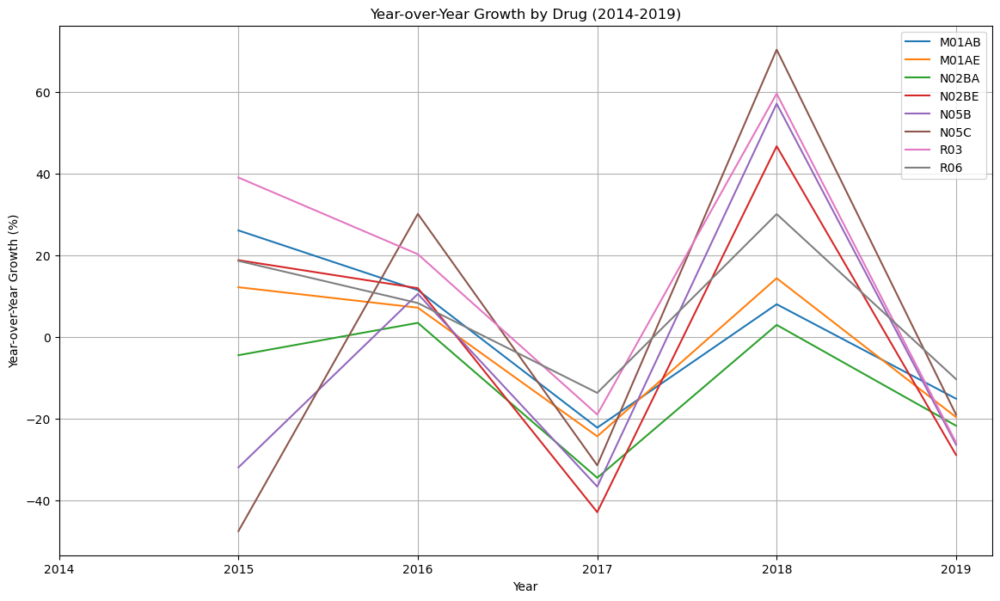

In [15]:
plt.figure(figsize=(14, 8))

for drug in drugs_columns:
    plt.plot(yoy_growth.index, yoy_growth[drug], label=drug)
plt.title("Year-over-Year Growth by Drug (2014-2019)")
plt.xlabel("Year")
plt.ylabel("Year-over-Year Growth (%)")
plt.xticks(yoy_growth.index, [str(year) for year in yoy_growth.index])
plt.legend()
plt.grid()

plt.show()

Finding cumulative growth

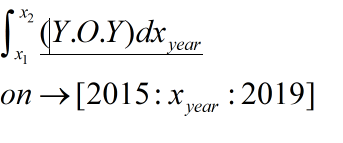

Using the trapezoidal numerical approximation method.

In [16]:
yoy_growth.index = yoy_growth.index.astype(int)

cumulative_growth = {}

for drug in drugs_columns:
    growth_curve = yoy_growth[drug].dropna().values 
    years = yoy_growth[drug].dropna().index.values 
    if len(growth_curve) > 1:
        area = np.trapz(growth_curve, x=years)
        cumulative_growth[drug] = area
    else:
        cumulative_growth[drug] = np.nan

cumulative_df = pd.DataFrame.from_dict(cumulative_growth, orient='index', columns=["Cumulative YoY Growth"])
cumulative_df = cumulative_df.sort_values("Cumulative YoY Growth", ascending=False)
print(cumulative_df)

       Cumulative YoY Growth
R03                67.618164
N05C               35.943740
R06                29.022335
N02BE              10.861096
M01AB               2.911722
N05B                2.002982
M01AE              -6.366394
N02BA             -41.046938


### Quick Notes:

`Above` So here we calculated the Y.O.Y growth for each drug. We also wanted to see which drugs may have the highest potential by measuring their cumulative growth. Since we set the Y.O.Y growth by year, it would be best to use the trapezoidal rule to find with drug has the biggest net area under the Y.O.Y growth curve. This will give us the highest cumulative growth. This is useful for identifying products with good potential.

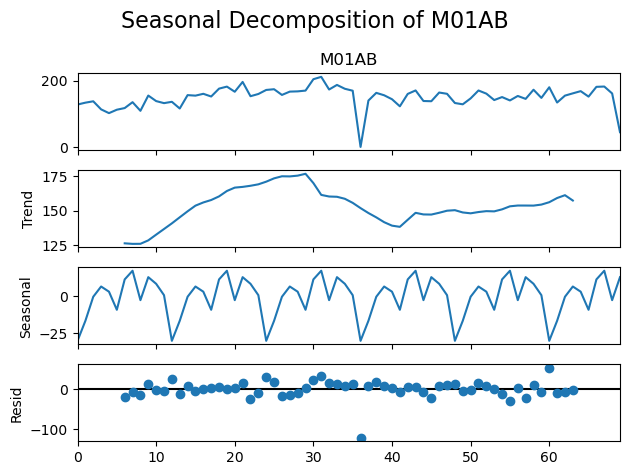

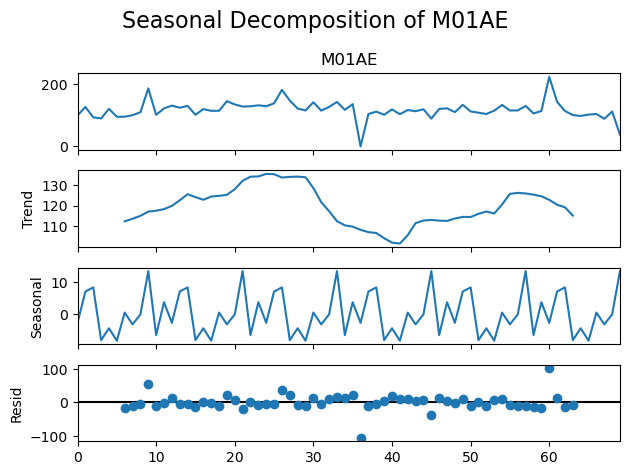

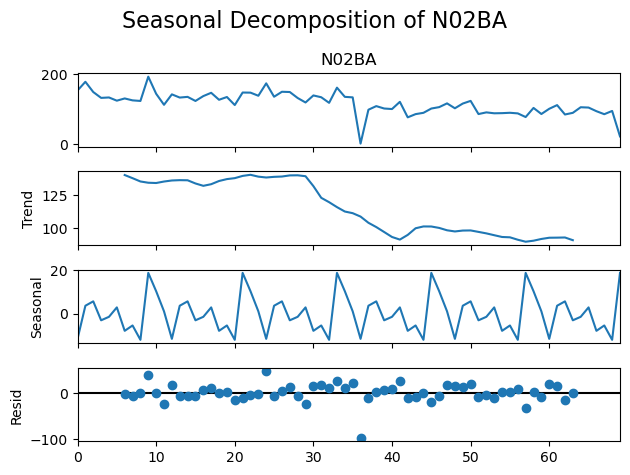

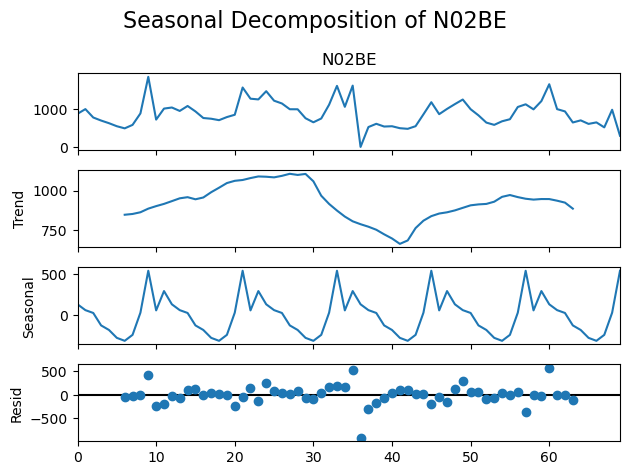

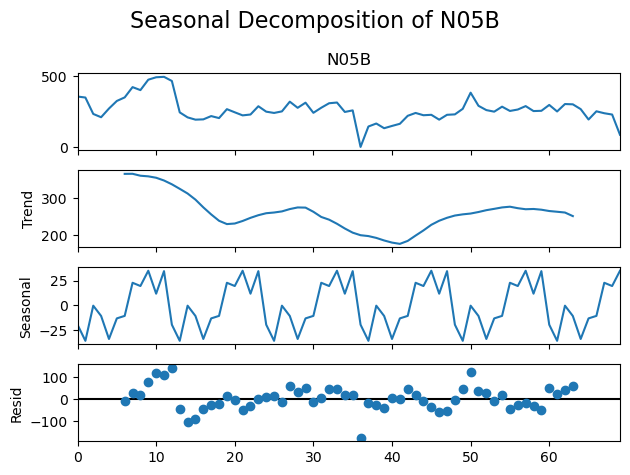

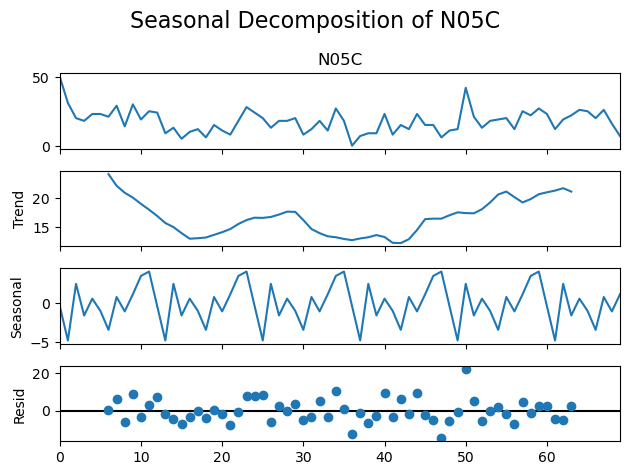

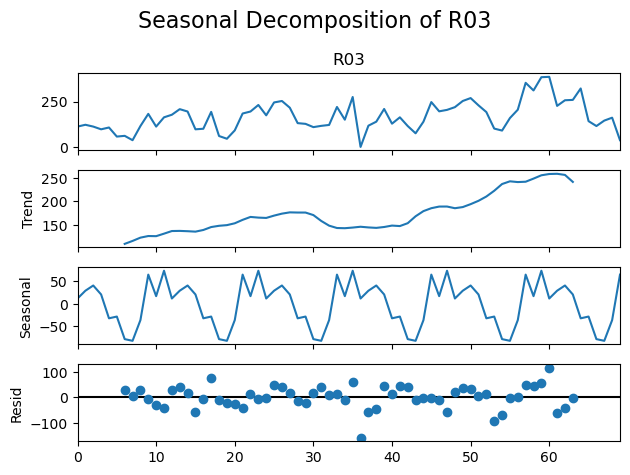

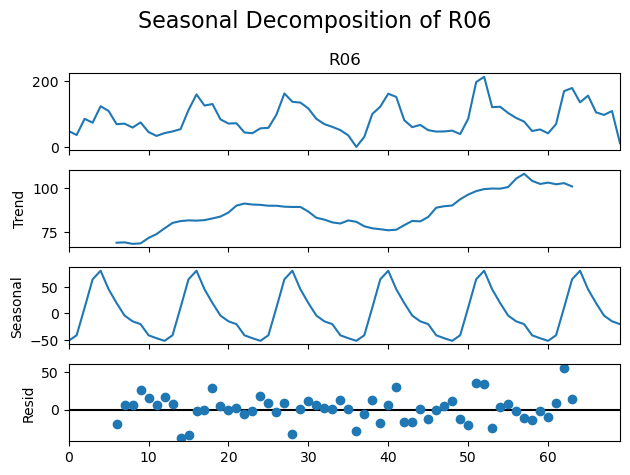

In [17]:
from statsmodels.tsa.seasonal import seasonal_decompose

figsize = (12, 8)
for drug in drugs_columns:
    result = seasonal_decompose(df_salesmonthly[drug], model='additive', period=12)
    result.plot()
    plt.suptitle(f"Seasonal Decomposition of {drug}", fontsize=16)
    plt.tight_layout()
    plt.show()



In [18]:
seasonality_strength = {}
for drug in drugs_columns:
    result = seasonal_decompose(df_salesmonthly[drug], model='additive', period=12)
    seasonality_strength[drug] = result.seasonal.var() / result.trend.var()

seasonality_df = pd.DataFrame.from_dict(seasonality_strength, orient='index', columns=["Seasonality Strength"])
seasonality_df.sort_values("Seasonality Strength", ascending=False, inplace=True)
print(seasonality_df)


       Seasonality Strength
R06               17.222011
N02BE              4.782192
R03                1.402891
M01AB              1.062657
N05C               0.650054
M01AE              0.578975
N05B               0.236950
N02BA              0.199591


In [19]:
outliers = {}

for drug in drugs_columns:
    result = seasonal_decompose(df_salesmonthly[drug], model='additive', period=12)
    resid = result.resid.dropna()  # Remove NaNs introduced by decomposition

    # Define an outlier as any point > 2 standard deviations from the mean
    threshold = 2 * resid.std()
    outlier_points = resid[np.abs(resid) > threshold]

    outliers[drug] = outlier_points

# Display outliers for each drug
for drug, points in outliers.items():
    print(f"\nOutliers for {drug}:")
    if not points.empty:
        print(points)
    else:
        print("No significant outliers detected.")



Outliers for M01AB:
36   -121.740410
60     53.673757
Name: resid, dtype: float64

Outliers for M01AE:
9      54.571301
36   -105.622633
60    102.373742
Name: resid, dtype: float64

Outliers for N02BA:
24    46.269269
36   -97.068231
Name: resid, dtype: float64

Outliers for N02BE:
9     425.117781
35    522.078306
36   -921.424719
60    581.341864
Name: resid, dtype: float64

Outliers for N05B:
10    120.471250
12    143.699583
36   -177.925417
50    123.196250
Name: resid, dtype: float64

Outliers for N05C:
47   -14.499826
50    22.108507
Name: resid, dtype: float64

Outliers for R03:
36   -157.517188
53    -93.759896
60    115.441146
Name: resid, dtype: float64

Outliers for R06:
14   -37.806420
62    56.190247
Name: resid, dtype: float64


09:12:45 - cmdstanpy - INFO - Chain [1] start processing
09:12:45 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
09:12:46 - cmdstanpy - INFO - Chain [1] start processing
09:12:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
09:12:46 - cmdstanpy - INFO - Chain [1] start processing
09:12:46 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  dates = pd.date_range(
09:1

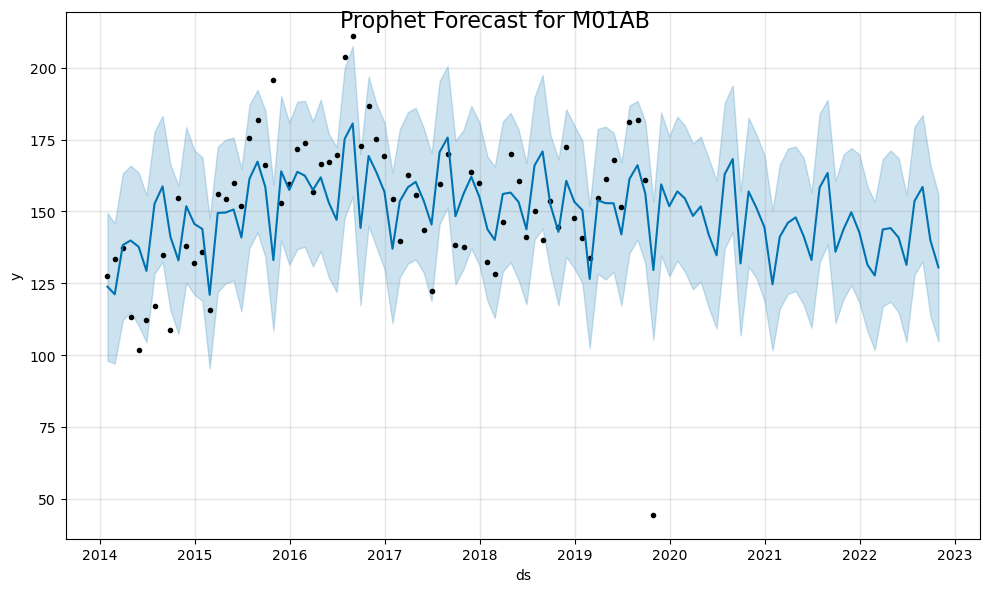

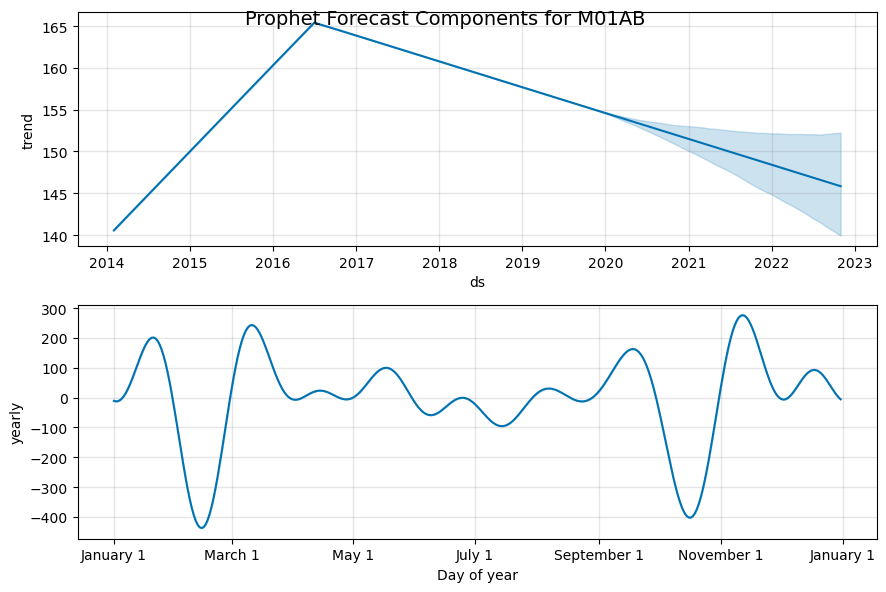

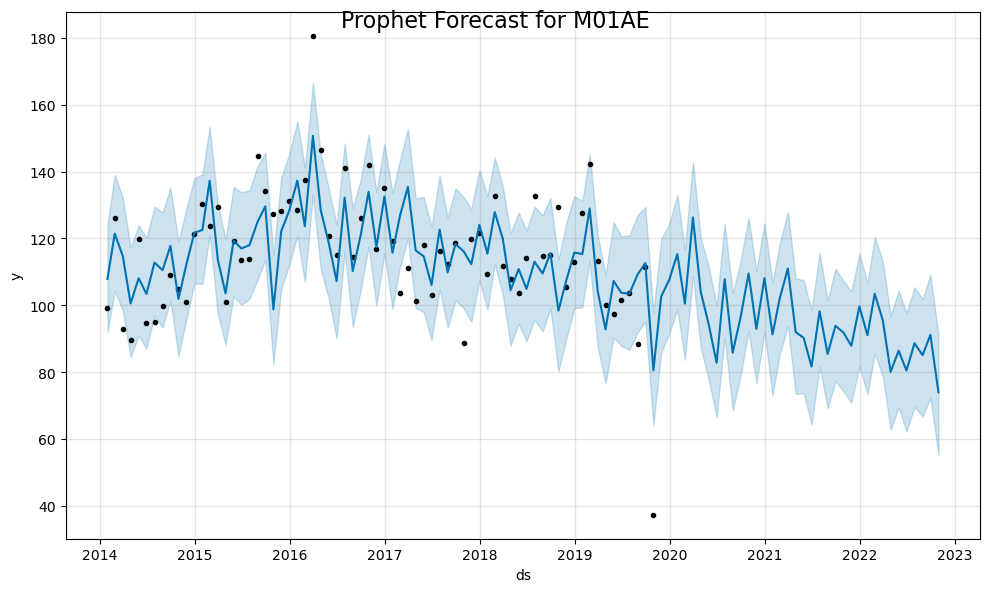

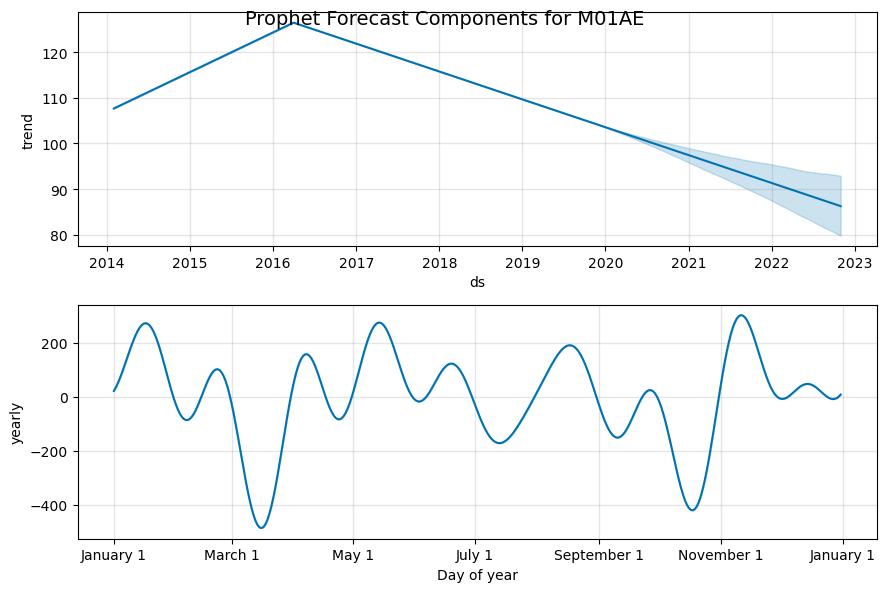

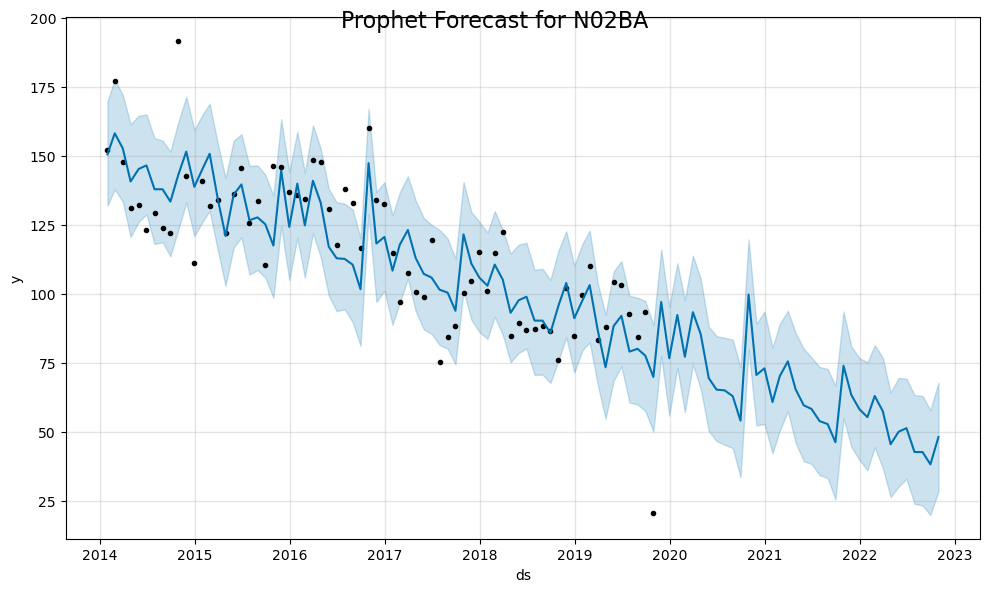

...

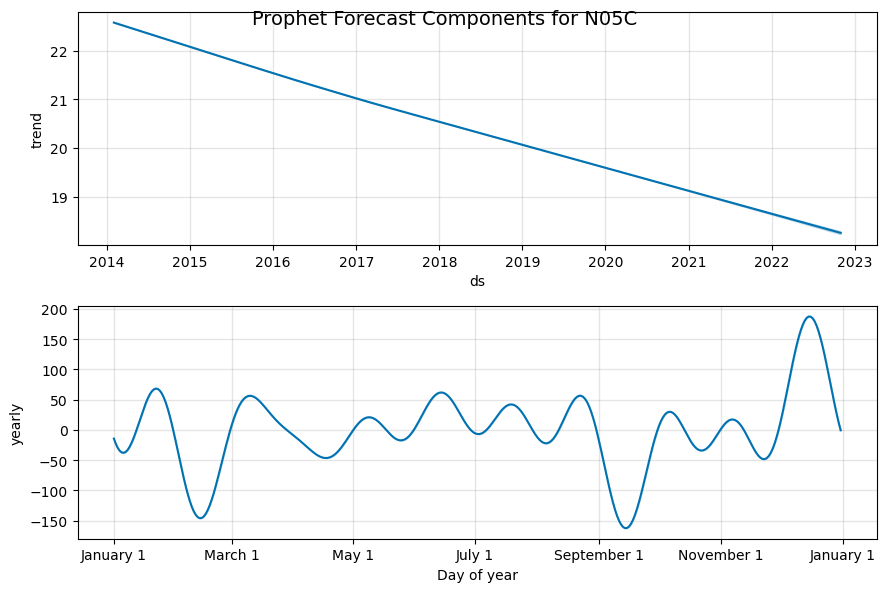

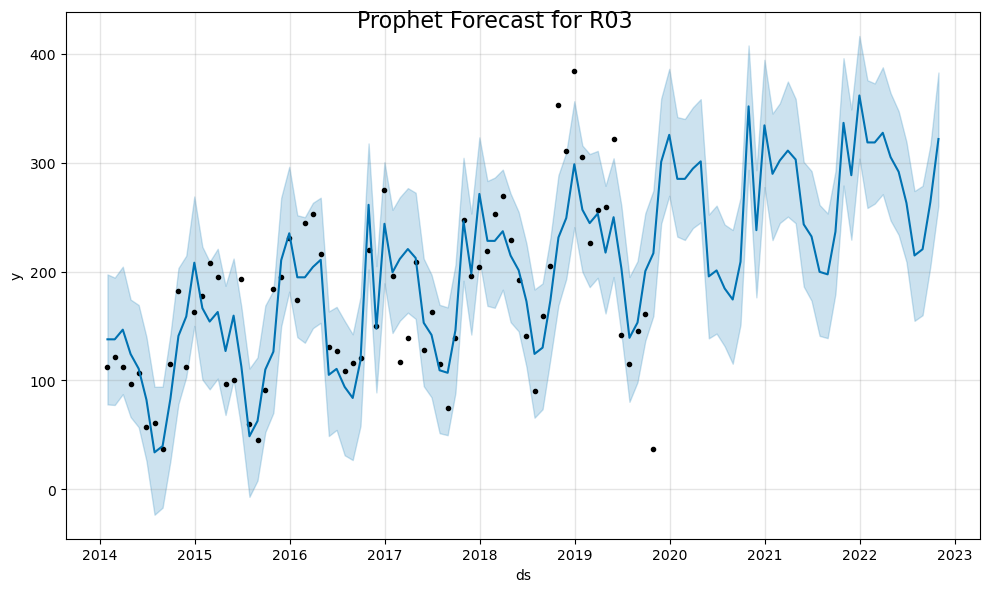

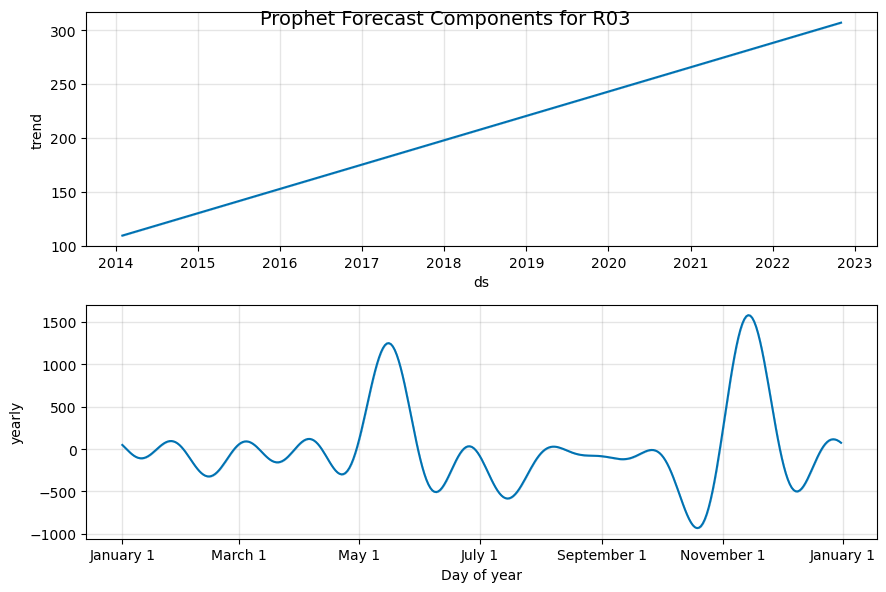

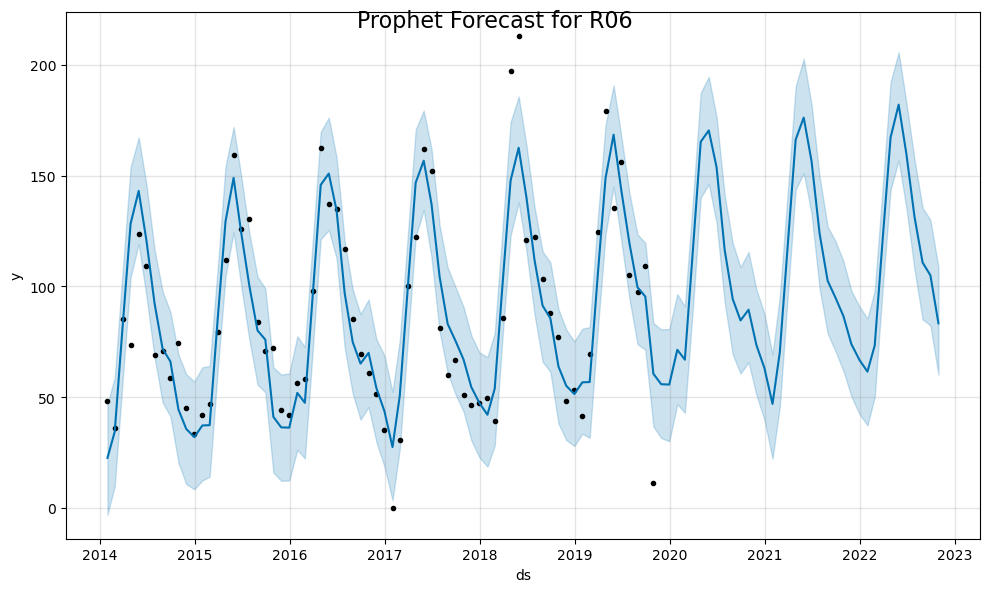

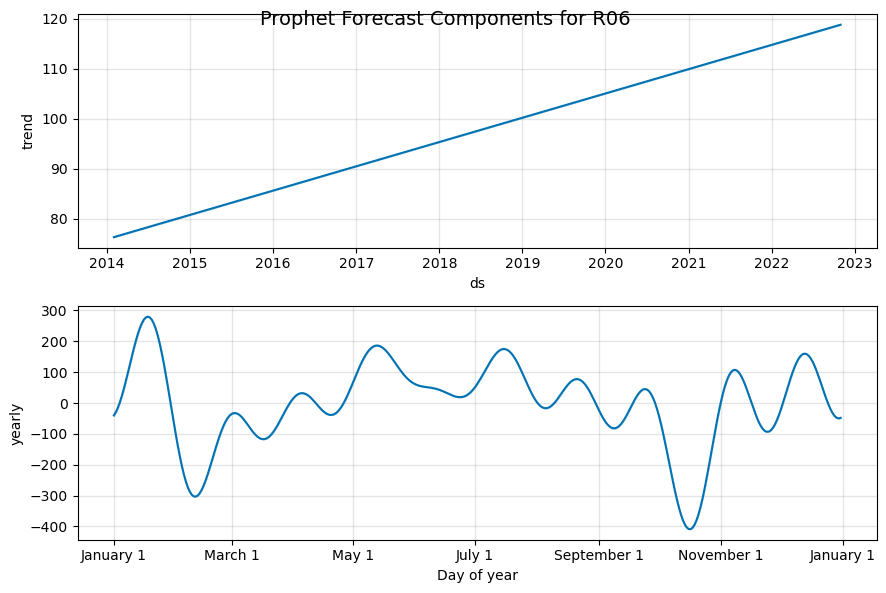

In [20]:
from prophet import Prophet

# Remove outliers from df_salesmonthly for each drug
df_salesmonthly_clean = df_salesmonthly.copy()

for drug, points in outliers.items():
    if not points.empty:
        df_salesmonthly_clean.loc[points.index, drug] = np.nan

# Optionally interpolate missing values
df_salesmonthly_clean.interpolate(method='linear', inplace=True)

# Prepare the dataframe
for drug in drugs_columns:
    df_prophet = df_salesmonthly_clean[['datum', drug]].rename(columns={'datum': 'ds', drug: 'y'})
    
# Initialize and fit the model
    model = Prophet()
    model.fit(df_prophet)

# Create future dataframe
    future = model.make_future_dataframe(periods=36, freq='M')  # Forecast 12 months ahead
    forecast = model.predict(future)

# Plot forecast
    fig1 = model.plot(forecast)
    fig1.suptitle(f"Prophet Forecast for {drug}", fontsize=16)

    fig2 = model.plot_components(forecast)
    fig2.suptitle(f"Prophet Forecast Components for {drug}", fontsize=14)


    figsize = (12, 8)



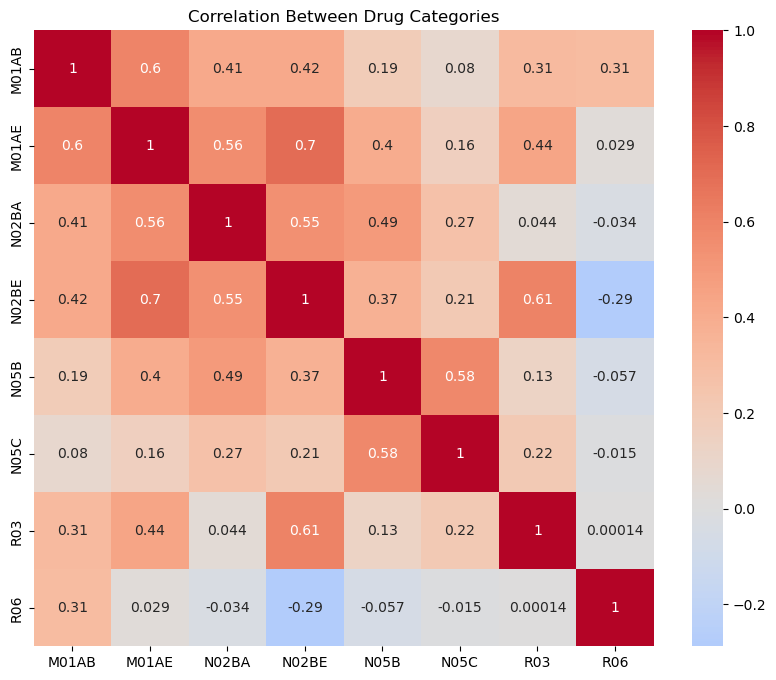

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Only use drug columns
drug_corr = df_salesmonthly[drugs_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(drug_corr, annot=True, cmap='coolwarm', center=0)
plt.title("Correlation Between Drug Categories")
plt.show()


In [22]:
# Let's start with M01AE
drug = 'M01AE'
df_ml = df_salesmonthly[[drug]].copy()
# Make sure index is datetime
df_ml.index = pd.to_datetime(df_ml.index)

# Base time features
df_ml['month'] = df_ml.index.month
df_ml['year'] = df_ml.index.year

# Cyclical month
df_ml['month_sin'] = np.sin(2 * np.pi * df_ml['month'] / 12)
df_ml['month_cos'] = np.cos(2 * np.pi * df_ml['month'] / 12)

# Add season and interaction terms
df_ml['season'] = df_ml['month'] % 12 // 3  # 0: Winter, etc.
df_ml['month_x_year'] = df_ml['month'] * df_ml['year']

# Lag features
for lag in range(1, 25):
    df_ml[f'lag_{lag}'] = df_ml[drug].shift(lag)
df_ml['lag_1_x_lag_2'] = df_ml['lag_1'] * df_ml['lag_2']
# Rolling features
df_ml['rolling_mean_3'] = df_ml[drug].rolling(3).mean()
df_ml['rolling_std_3'] = df_ml[drug].rolling(3).std()
df_ml['rolling_max_6'] = df_ml[drug].rolling(6).max()
df_ml['rolling_min_6'] = df_ml[drug].rolling(6).min()

# Optional: winsorize extreme spikes
from scipy.stats.mstats import winsorize
df_ml[drug] = winsorize(df_ml[drug], limits=[0.05, 0.05])

# Drop NA rows
df_ml.dropna(inplace=True)


In [23]:
from sklearn.model_selection import train_test_split

X = df_ml.drop(columns=[drug])
y = df_ml[drug]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=12, shuffle=False)


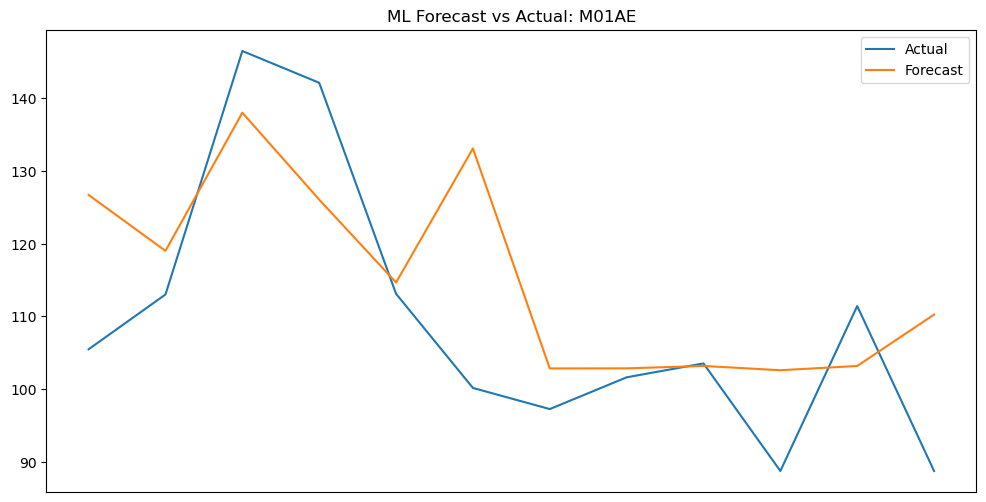

In [24]:
from xgboost import XGBRegressor

from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV

# Parameter tuning
params = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 5, 7]
}

grid = GridSearchCV(XGBRegressor(), params, cv=3, scoring='neg_mean_absolute_error')
grid.fit(X_train, y_train)

# Use best model
model = grid.best_estimator_
y_pred = model.predict(X_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test.values, label='Actual')
plt.plot(y_test.index, y_pred, label='Forecast')
plt.title(f"ML Forecast vs Actual: {drug}")
plt.legend()
plt.show()


In [25]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae:.2f}, RMSE: {rmse:.2f}, R²: {r2:.2f}")


MAE: 11.43, RMSE: 14.89, R²: 0.28


C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


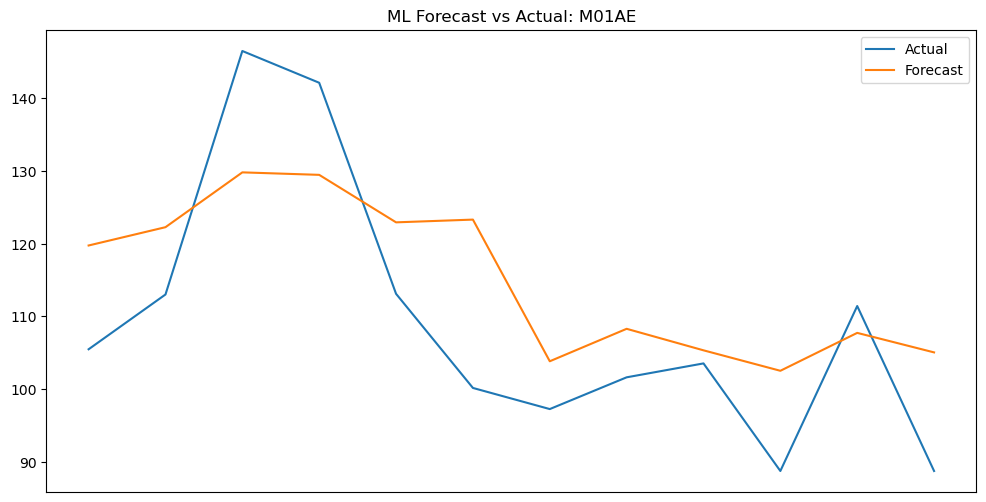

In [26]:
from sklearn.ensemble import RandomForestRegressor


model = RandomForestRegressor(n_estimators=200, max_depth=6, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test.values, label='Actual')
plt.plot(y_test.index, y_pred, label='Forecast')
plt.title(f"ML Forecast vs Actual: {drug}")
plt.legend()

In [27]:
mae = mean_absolute_error(y_test, y_pred)
rmse = mean_squared_error(y_test, y_pred, squared=False)
r2 = r2_score(y_test, y_pred)

print(f"MAE: {mae:.2f}, RMSE: {rmse:.2f}, R²: {r2:.2f}")

MAE: 11.23, RMSE: 12.66, R²: 0.48


C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


In [28]:
processed_drugs = {}

# Loop through each drug column
for drug in df_salesmonthly.columns:
    df_ml = df_salesmonthly[[drug]].copy()
    df_ml.index = pd.to_datetime(df_ml.index)

    # Ensure drug series is numeric before feature creation
    df_ml[drug] = pd.to_numeric(df_ml[drug], errors='coerce')

    # Base time features
    df_ml['month'] = df_ml.index.month
    df_ml['year'] = df_ml.index.year

    # Cyclical month
    df_ml['month_sin'] = np.sin(2 * np.pi * df_ml['month'] / 12)
    df_ml['month_cos'] = np.cos(2 * np.pi * df_ml['month'] / 12)

    # Season and interaction terms
    df_ml['season'] = df_ml['month'] % 12 // 3
    df_ml['month_x_year'] = df_ml['month'] * df_ml['year']

    # Lag features
    for lag in range(1, 25):
        df_ml[f'lag_{lag}'] = df_ml[drug].shift(lag)
    df_ml['lag_1_x_lag_2'] = df_ml['lag_1'] * df_ml['lag_2']

    # Rolling features
    df_ml['rolling_mean_3'] = df_ml[drug].rolling(3).mean()
    df_ml['rolling_std_3'] = df_ml[drug].rolling(3).std()
    df_ml['rolling_max_6'] = df_ml[drug].rolling(6).max()
    df_ml['rolling_min_6'] = df_ml[drug].rolling(6).min()

    # Winsorize spikes
    df_ml[drug] = winsorize(df_ml[drug], limits=[0.05, 0.05])

    # Drop NA rows (due to lags and rolling)
    df_ml.dropna(inplace=True)

    # Store in dictionary
    processed_drugs[drug] = df_ml

In [29]:
results = {}

for drug, df_ml in processed_drugs.items():
    # Split features and target
    X = df_ml.drop(columns=[drug])
    y = df_ml[drug]

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=12, shuffle=False)

    # Train model
    model = RandomForestRegressor(n_estimators=200, max_depth=6, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Store results
    results[drug] = {
        'y_test': y_test,
        'y_pred': y_pred,
        'index': y_test.index,
        'mae': mean_absolute_error(y_test, y_pred),
        'rmse': mean_squared_error(y_test, y_pred, squared=False),
        'r2': r2_score(y_test, y_pred)
    }



C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecat

datum — MAE: 17130960000000000.00, RMSE: 18665049936863284.00, R²: -5.34


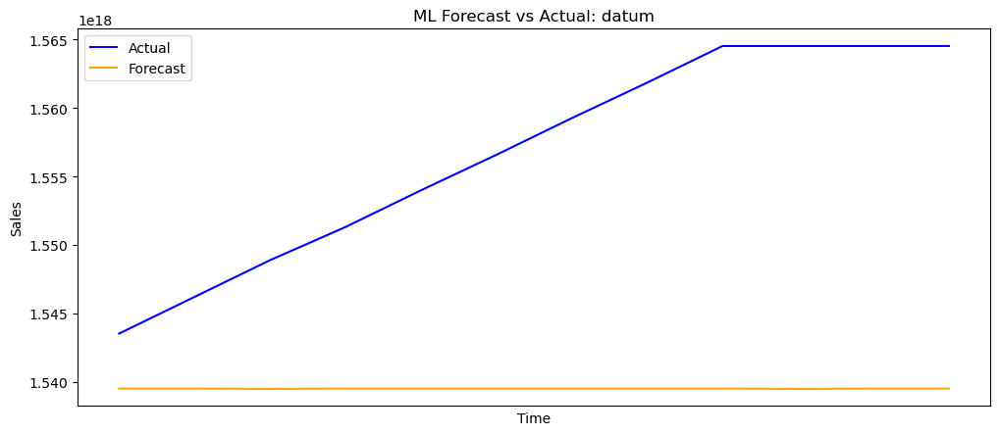

M01AB — MAE: 14.84, RMSE: 18.19, R²: 0.22


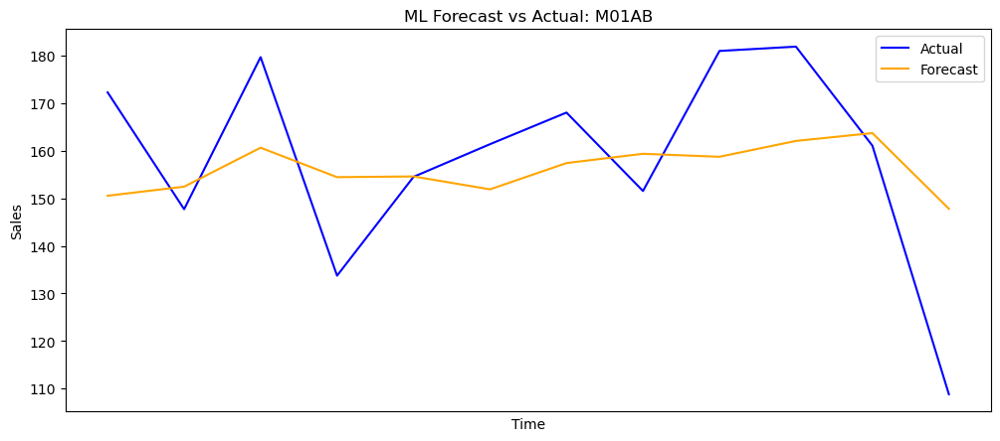

M01AE — MAE: 11.23, RMSE: 12.66, R²: 0.48


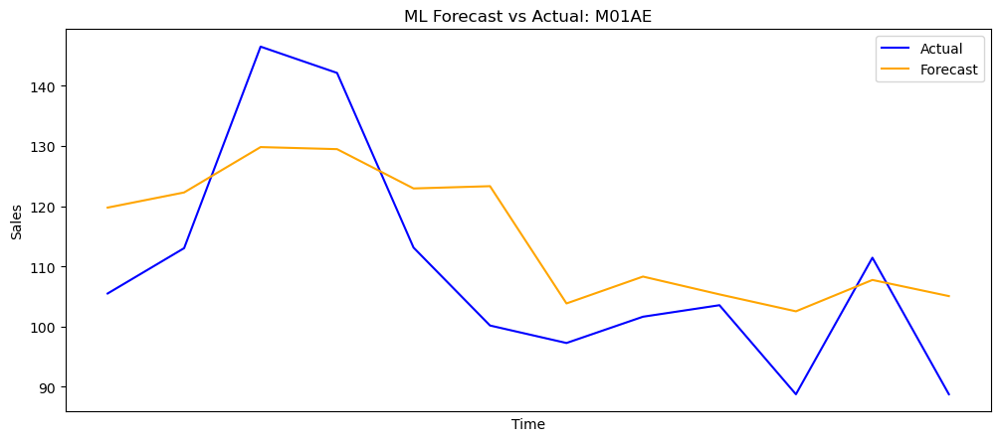

N02BA — MAE: 9.56, RMSE: 11.14, R²: -0.24


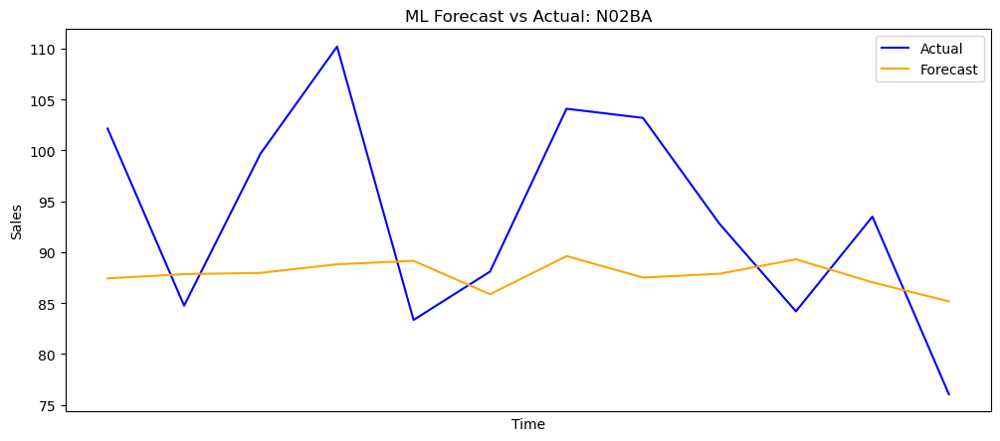

N02BE — MAE: 157.50, RMSE: 187.39, R²: 0.65


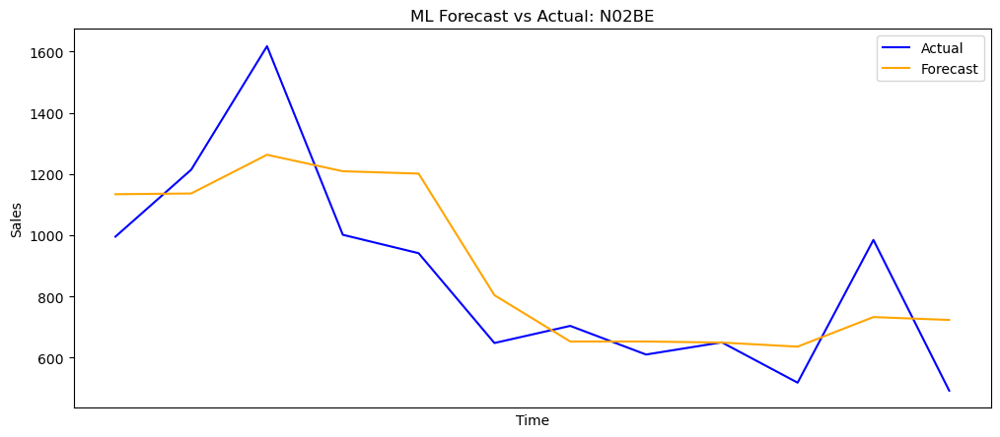

N05B — MAE: 26.53, RMSE: 34.80, R²: 0.35


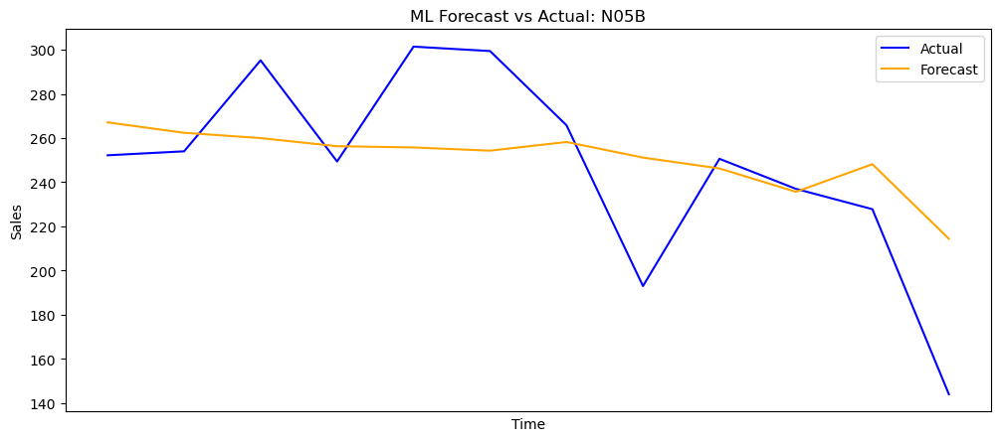

N05C — MAE: 5.66, RMSE: 6.34, R²: -0.17


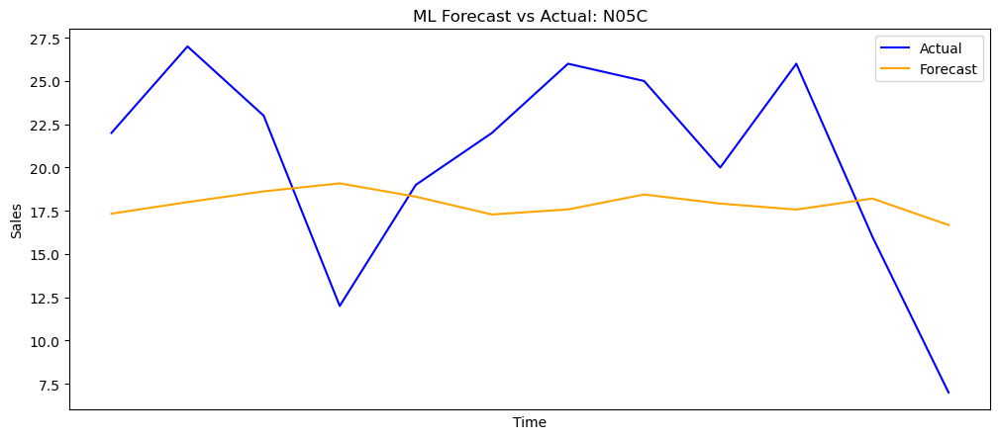

R03 — MAE: 61.41, RMSE: 68.57, R²: 0.43


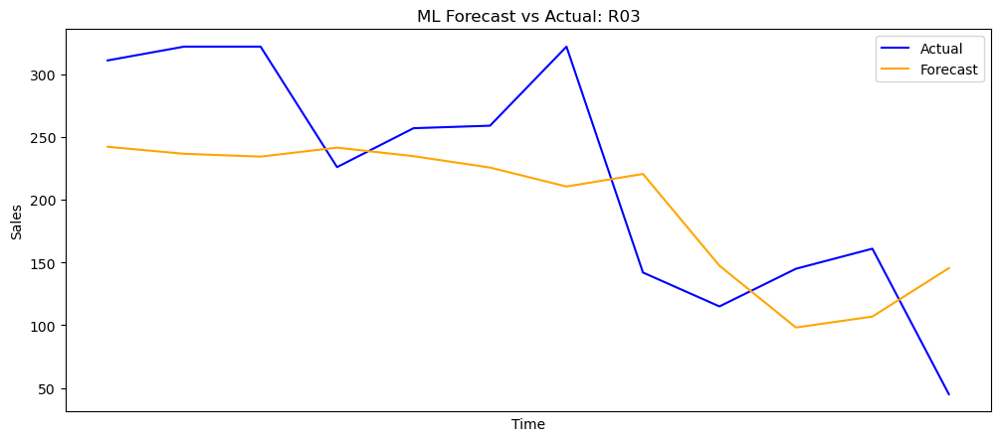

R06 — MAE: 18.45, RMSE: 24.47, R²: 0.74


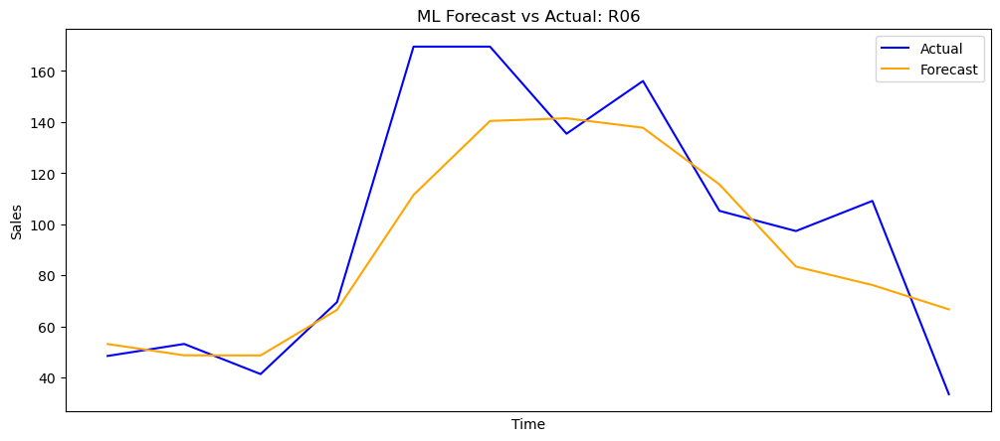

Total Sales — MAE: 203.39, RMSE: 236.17, R²: 0.61


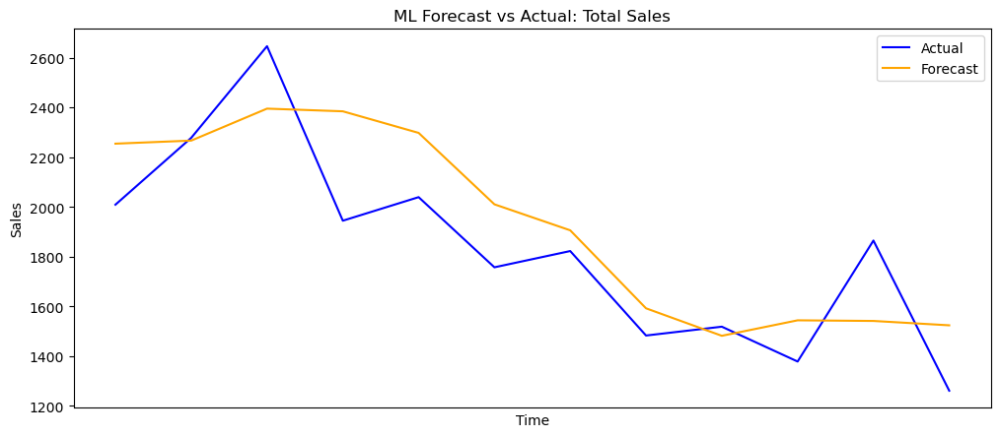

Month — MAE: 0.12, RMSE: 0.23, R²: 1.00


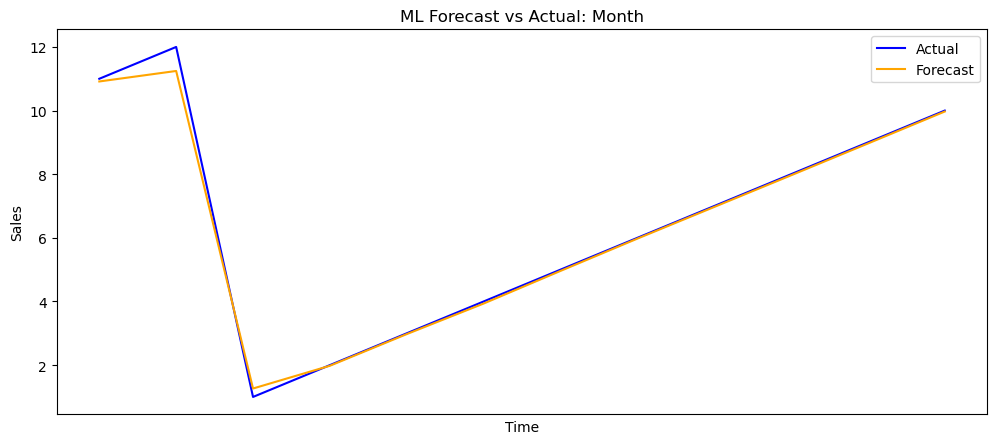

Year — MAE: 0.83, RMSE: 0.91, R²: -5.00


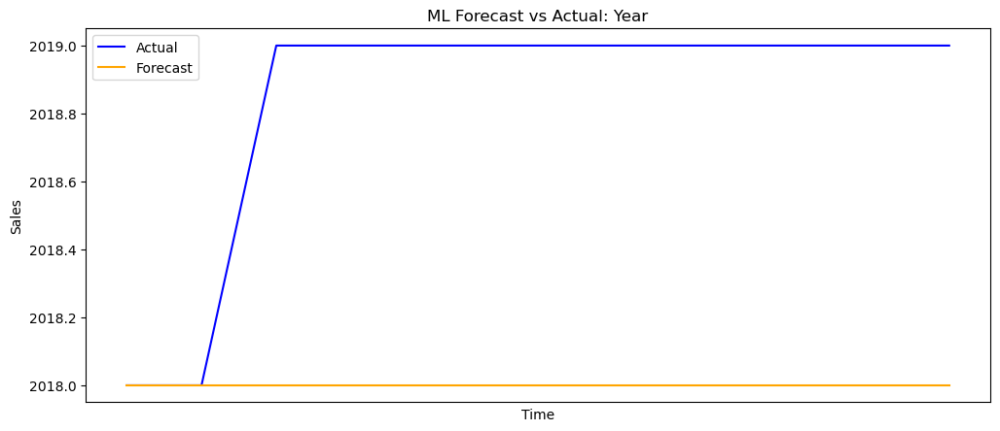

In [30]:
for drug, res in results.items():
    print(f"{drug} — MAE: {res['mae']:.2f}, RMSE: {res['rmse']:.2f}, R²: {res['r2']:.2f}")
    
    plt.figure(figsize=(12, 5))
    plt.plot(res['index'], res['y_test'].values, label='Actual', color='blue')
    plt.plot(res['index'], res['y_pred'], label='Forecast', color='orange')
    plt.title(f"ML Forecast vs Actual: {drug}")
    plt.xlabel("Time")
    plt.ylabel("Sales")
    plt.legend()
    plt.show()


In [31]:
results_gs = {}

for drug, df_ml in processed_drugs.items():
    # Split features and target
    x = df_ml.drop(columns=[drug])
    y = df_ml[drug]

    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=12, shuffle=False)

    # Setup and run grid search
    rf = RandomForestRegressor(random_state=42)
    grid_search = GridSearchCV(
        estimator=rf,
        param_grid=param_grid,
        cv=3,
        scoring='r2',
        n_jobs=-1,
        verbose=0
    )

    grid_search.fit(x_train, y_train)
    best_model = grid_search.best_estimator_

    # Make predictions
    y_pred = best_model.predict(x_test)

    # Store results
    results_gs[drug] = {
        'y_test': y_test,
        'y_pred': y_pred,
        'index': y_test.index,
        'mae': mean_absolute_error(y_test, y_pred),
        'rmse': mean_squared_error(y_test, y_pred, squared=False),
        'r2': r2_score(y_test, y_pred),
        'best_params': grid_search.best_params_,
    }

# Plot all results
for drug, res in results_gs.items():
    print(f"{drug} — MAE: {res['mae']:.2f}, RMSE: {res['rmse']:.2f}, R²: {res['r2']:.2f}")

    plt.figure(figsize=(12, 5))
    plt.plot(res['index'], res['y_test'].values, label='Actual', color='blue')
    plt.plot(res['index'], res['y_pred'], label='Forecast', color='orange')
    plt.title(f"Grid Search Forecast vs Actual: {drug}")
    plt.xlabel("Time")
    plt.ylabel("Sales")
    plt.legend()
    plt.show()



NameError: name 'param_grid' is not defined

In [42]:
df_saleshourly = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\saleshourly.csv")
df_saleshourly.describe()

,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour
count,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000,50532.000000
mean,0.209787,0.162365,0.161723,1.246842,0.368989,0.024736,0.229732,0.120870,2016.401409,6.344811,11.500475
std,0.556003,0.416109,0.453211,2.387392,0.930934,0.217871,1.240513,0.391999,1.664444,3.385761,6.921706
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2014.000000,1.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.000000,3.000000,6.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2016.000000,6.000000,12.000000
75%,0.000000,0.000000,0.000000,1.875000,0.000000,0.000000,0.000000,0.000000,2018.000000,9.000000,17.000000
max,7.000000,6.000000,6.500000,29.000000,15.000000,6.000000,25.000000,5.000000,2019.000000,12.000000,23.000000


C:\Users\Rahul's PC\AppData\Local\Temp\ipykernel_26564\163095294.py:29: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df_saleshourly_clean.interpolate(method='linear', inplace=True)
09:37:10 - cmdstanpy - INFO - Chain [1] start processing
09:37:13 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


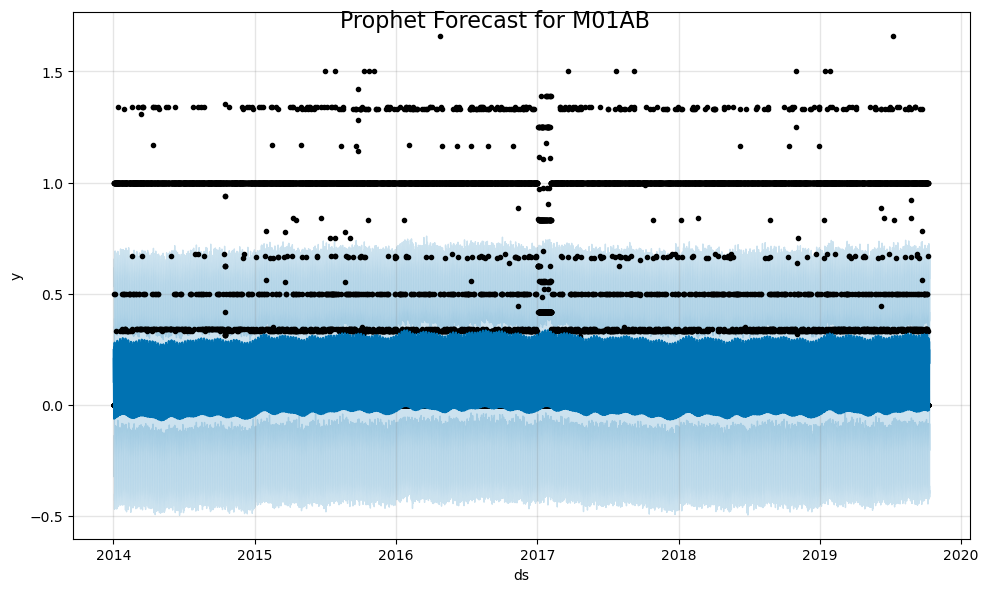

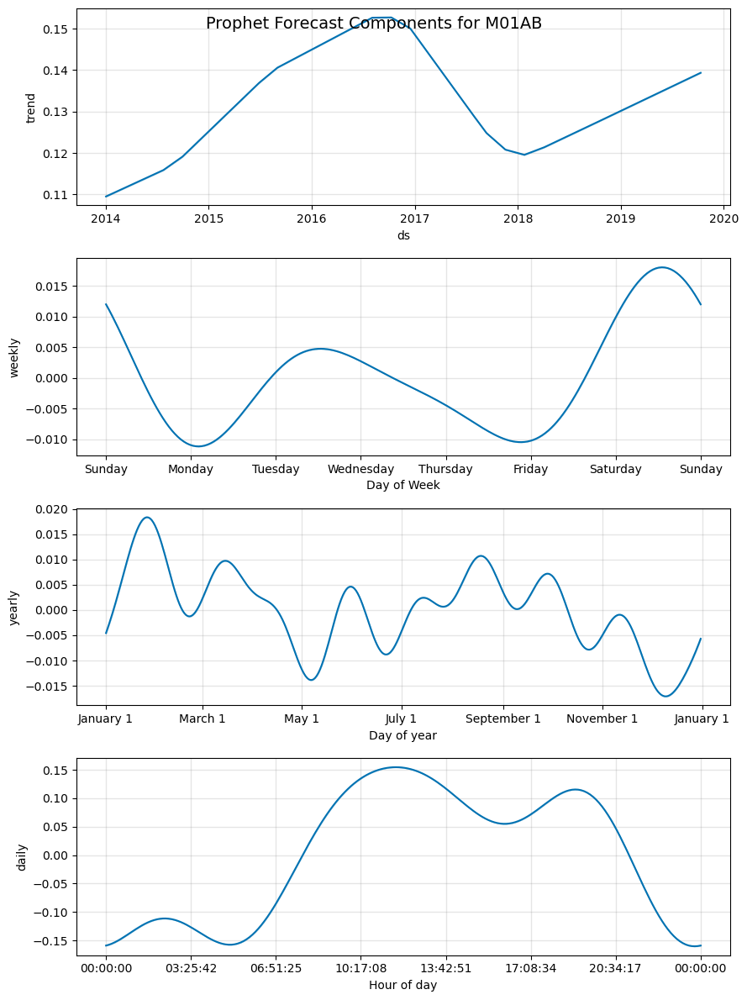

09:37:19 - cmdstanpy - INFO - Chain [1] start processing
09:37:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


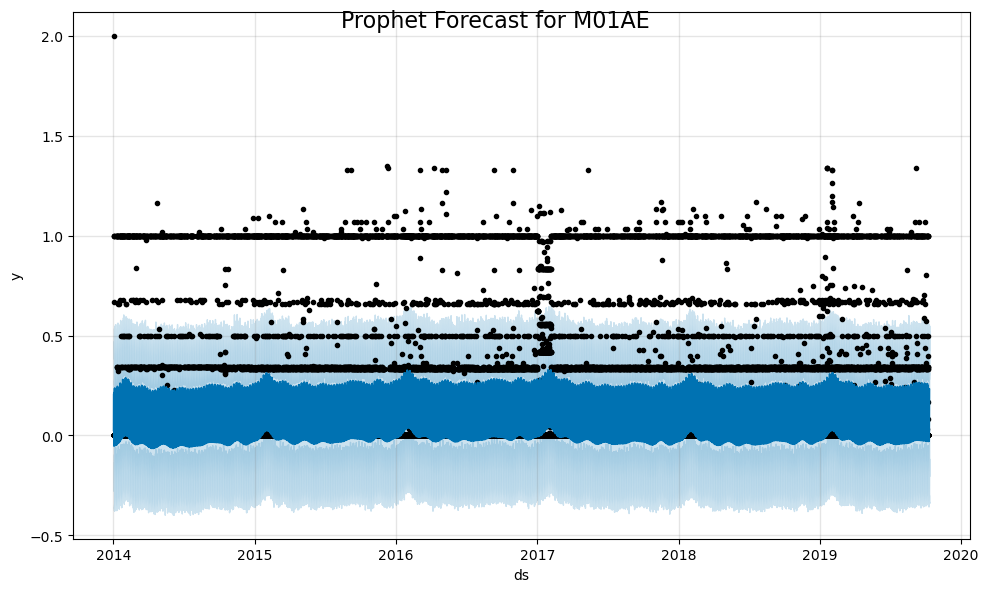

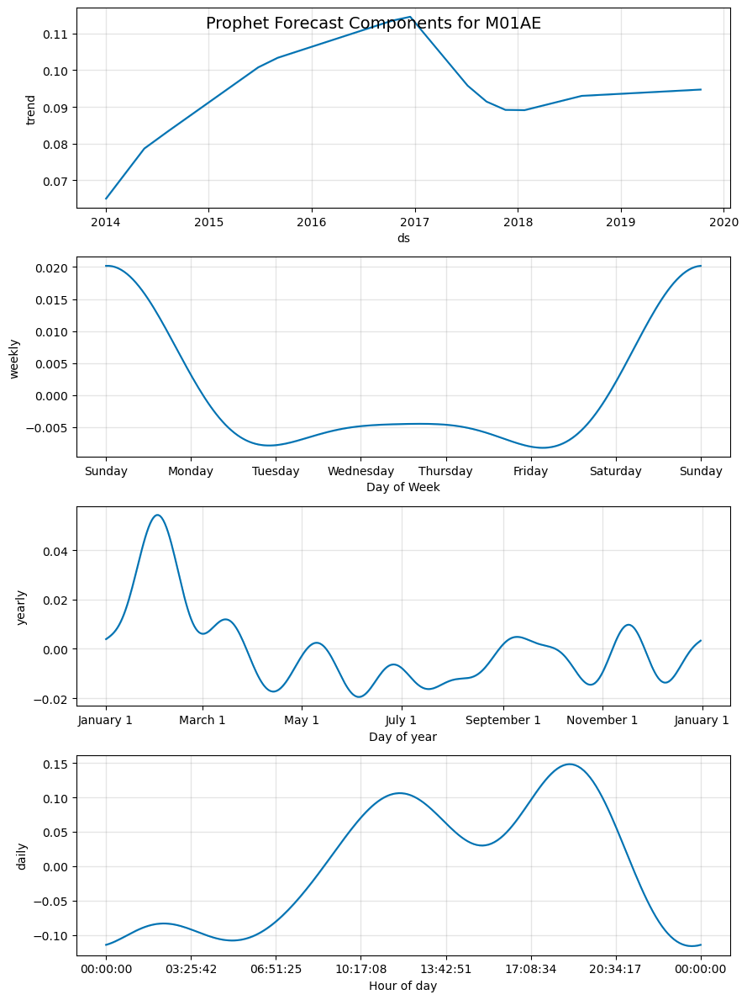

09:37:30 - cmdstanpy - INFO - Chain [1] start processing
09:37:33 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


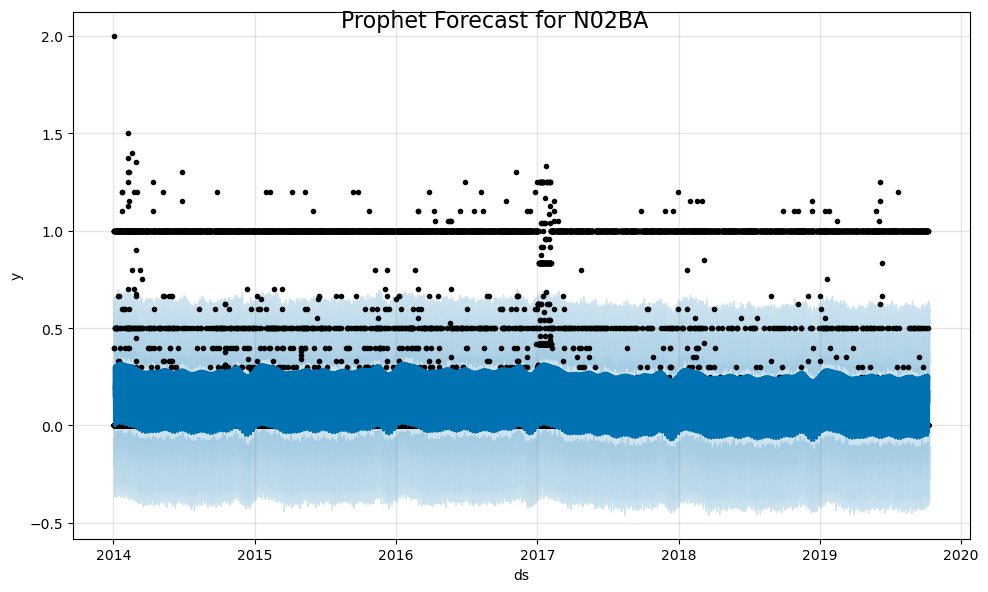

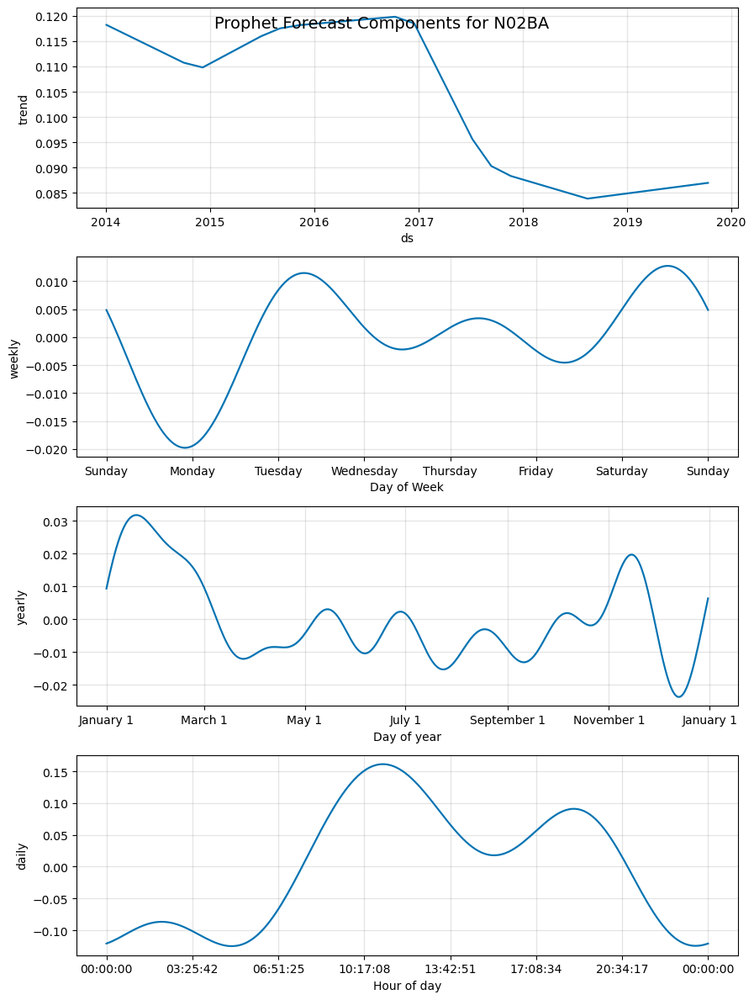

09:37:39 - cmdstanpy - INFO - Chain [1] start processing
09:37:47 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


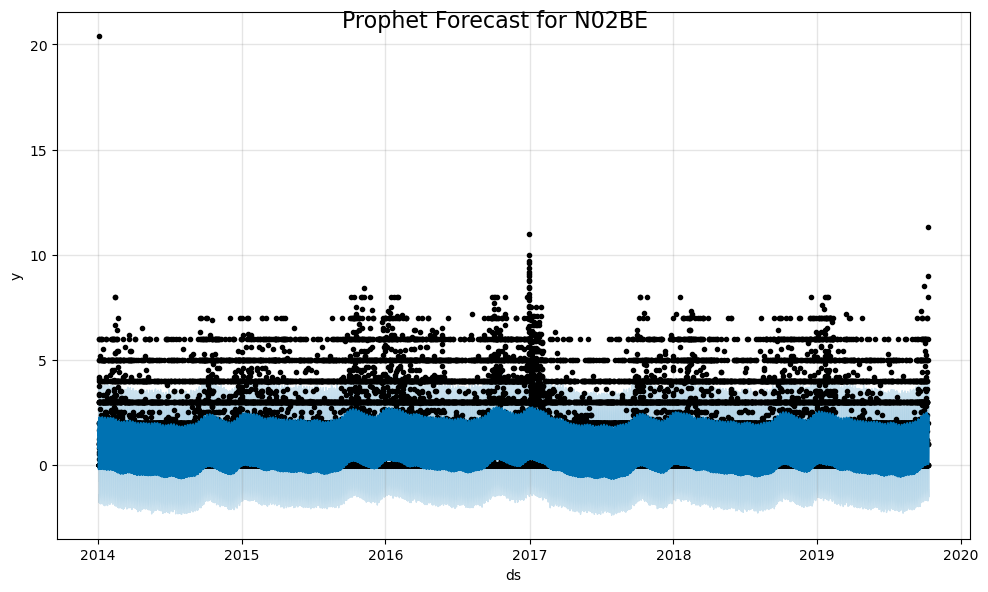

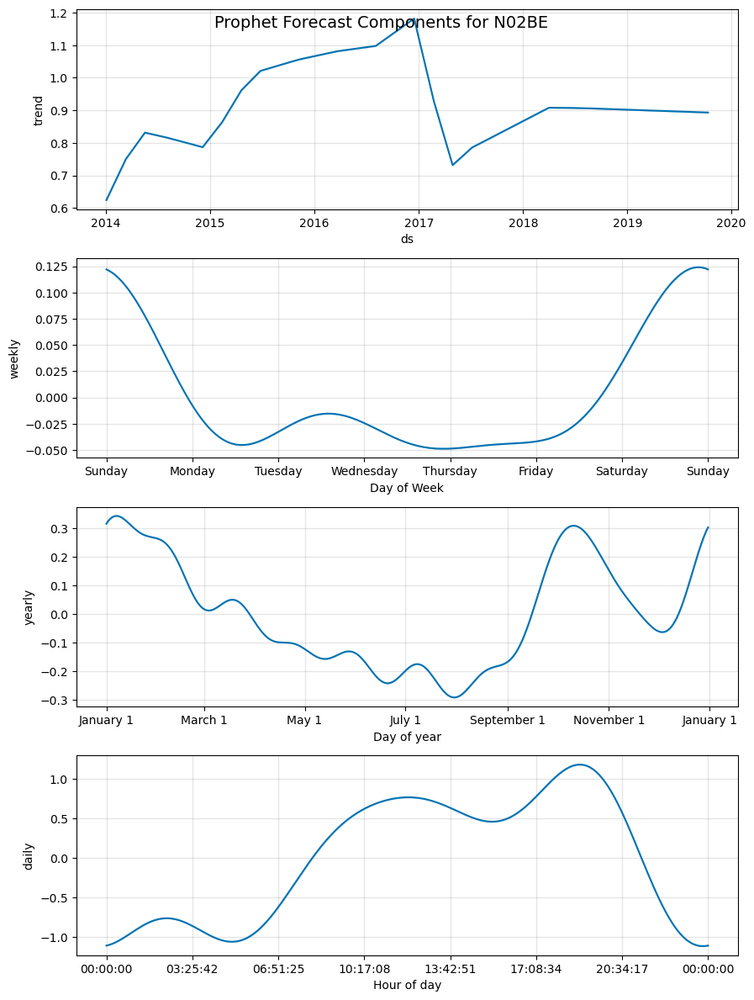

09:37:53 - cmdstanpy - INFO - Chain [1] start processing
09:38:01 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


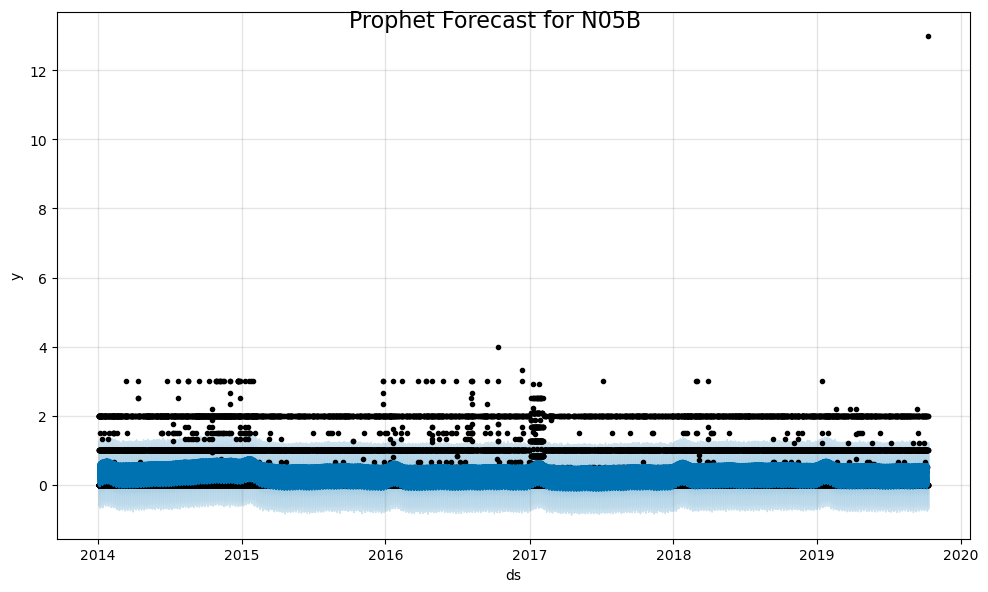

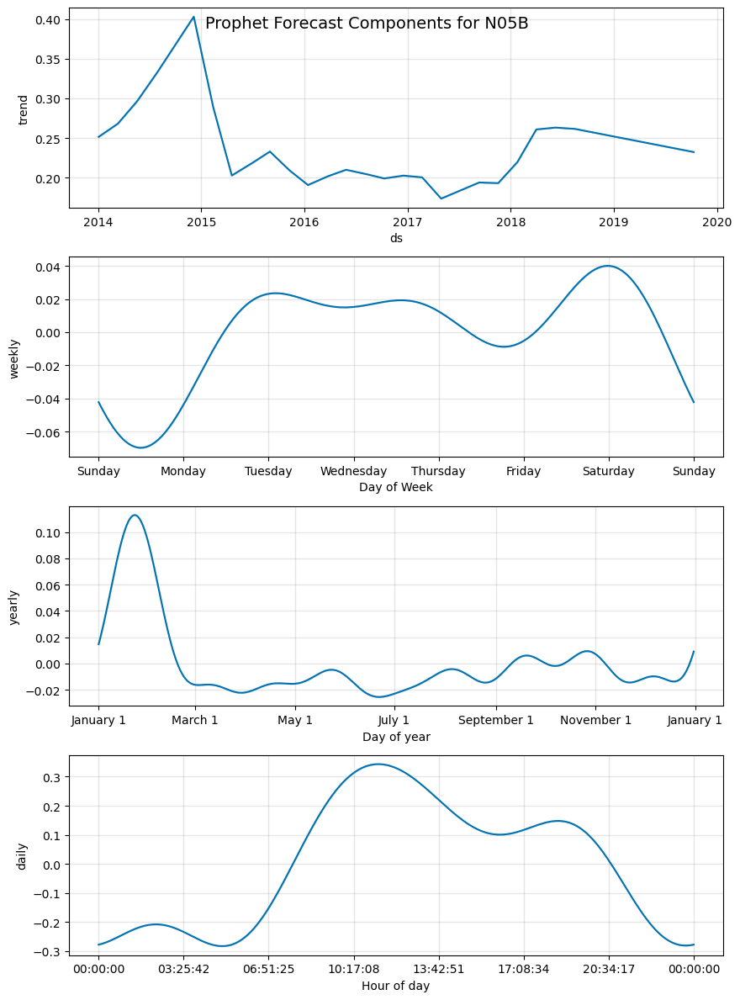

09:38:06 - cmdstanpy - INFO - Chain [1] start processing
09:38:16 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


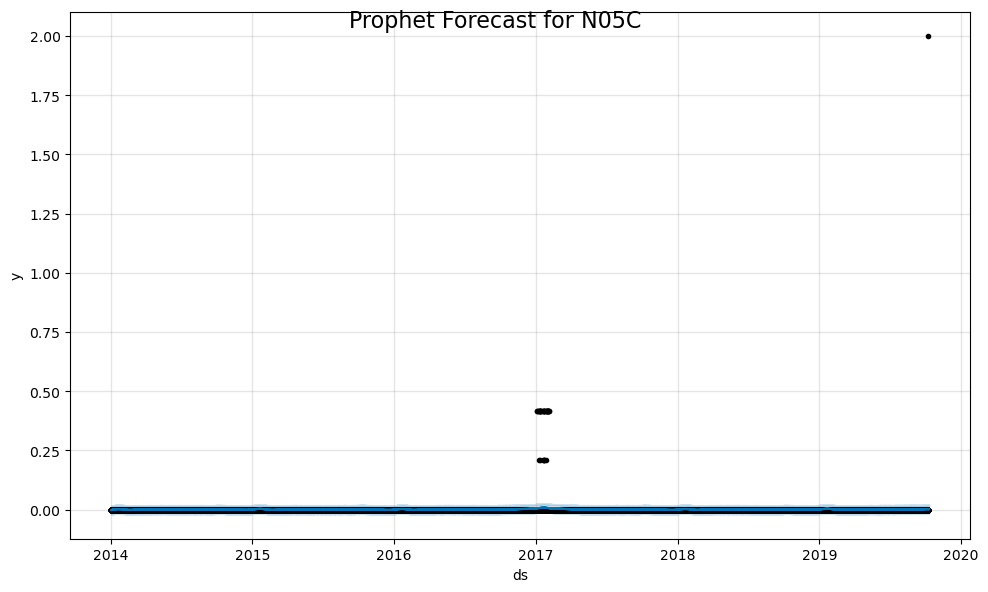

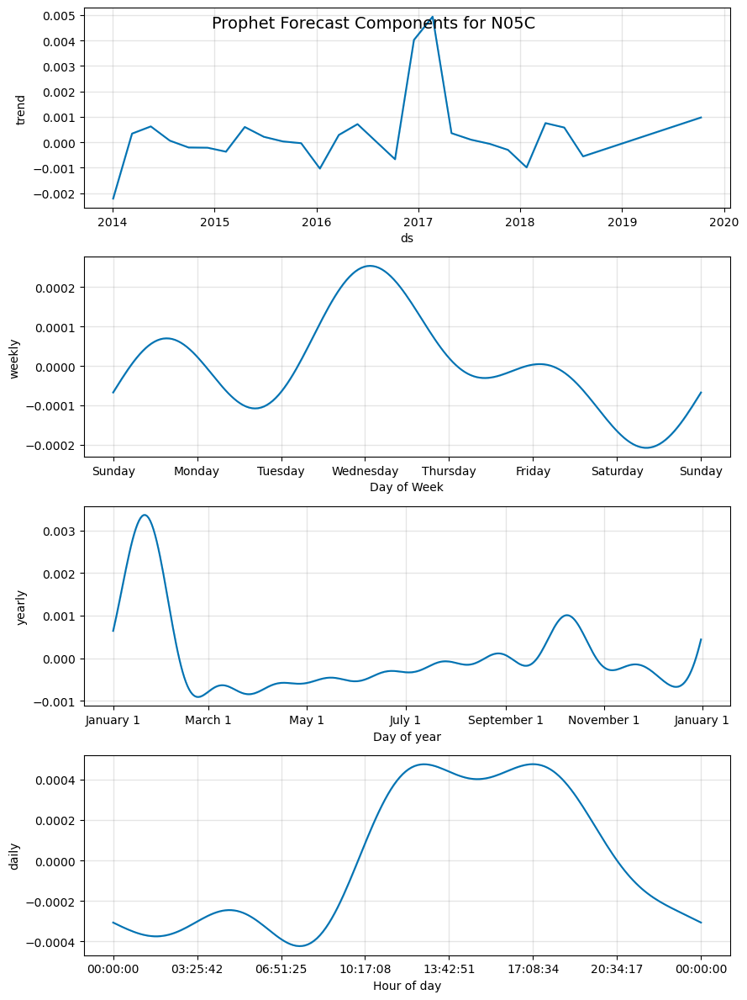

09:38:22 - cmdstanpy - INFO - Chain [1] start processing
09:38:28 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


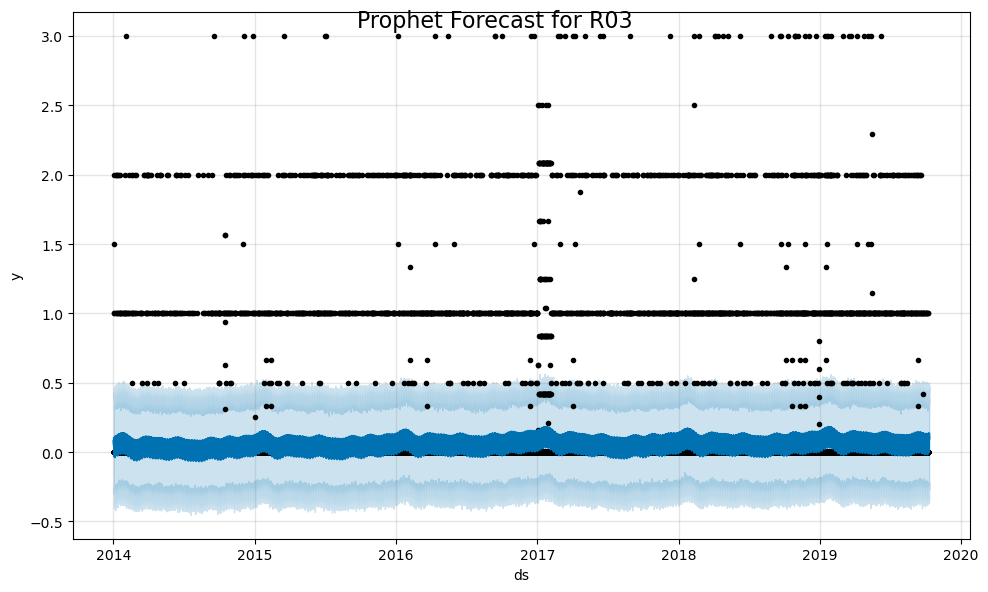

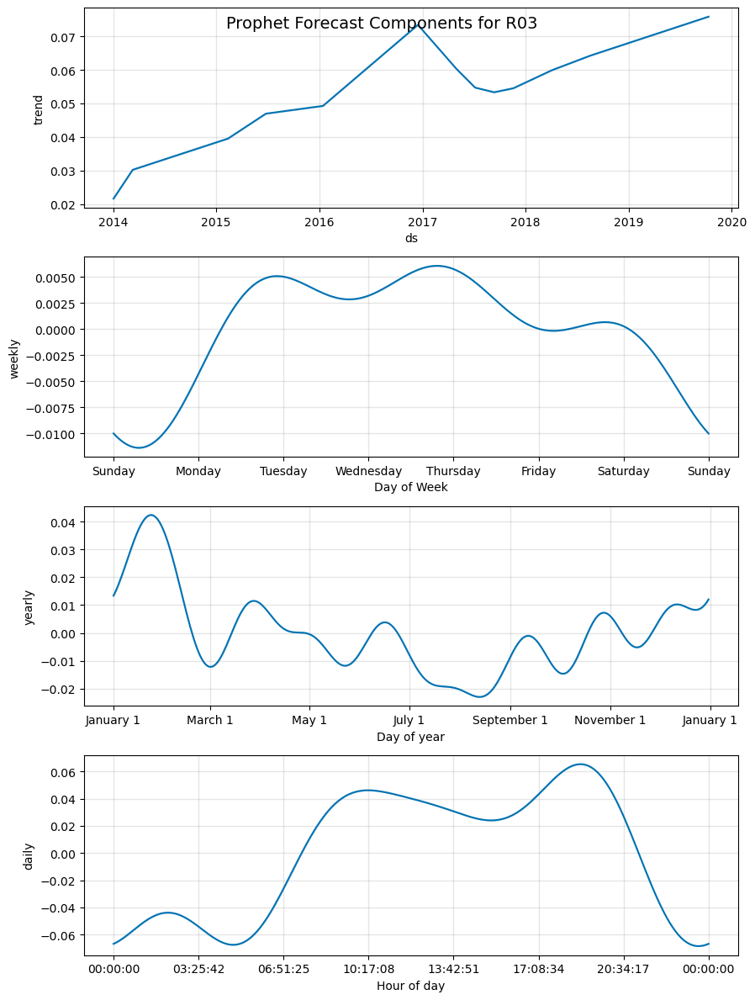

09:38:33 - cmdstanpy - INFO - Chain [1] start processing
09:38:41 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


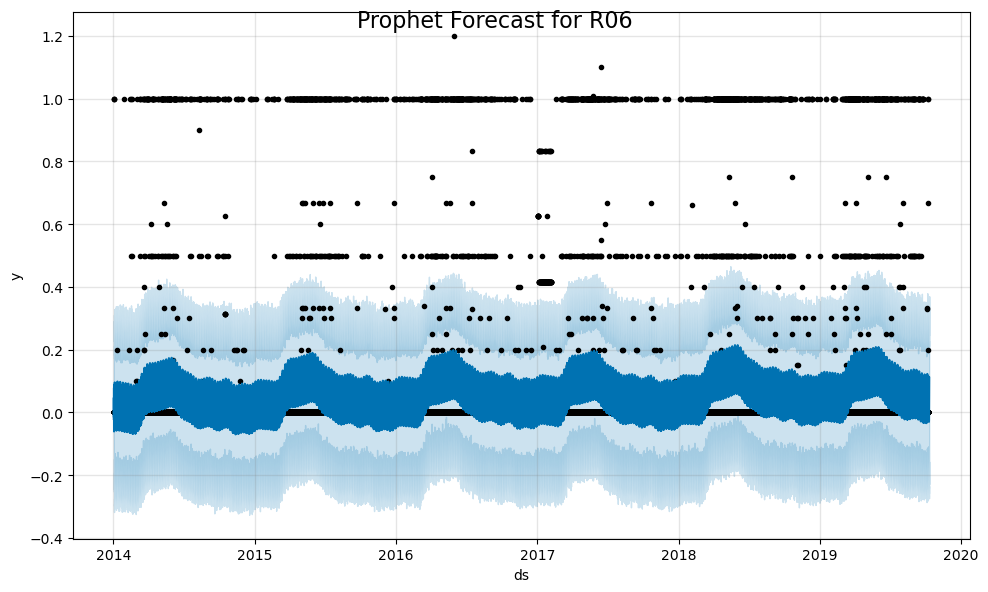

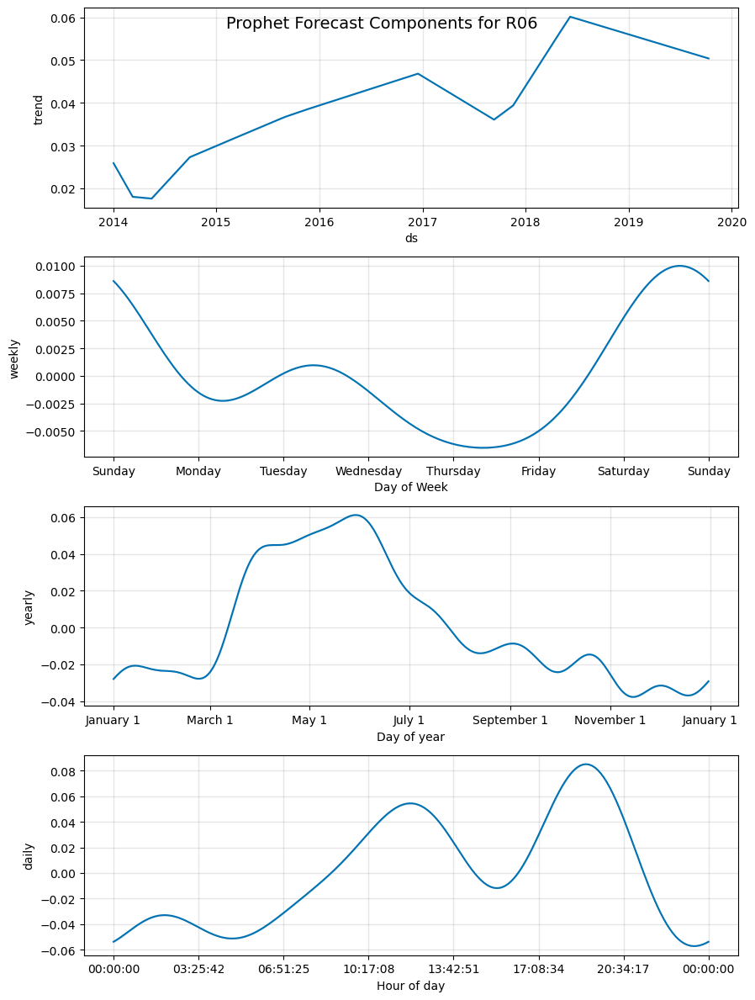

09:38:46 - cmdstanpy - INFO - Chain [1] start processing
09:38:54 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


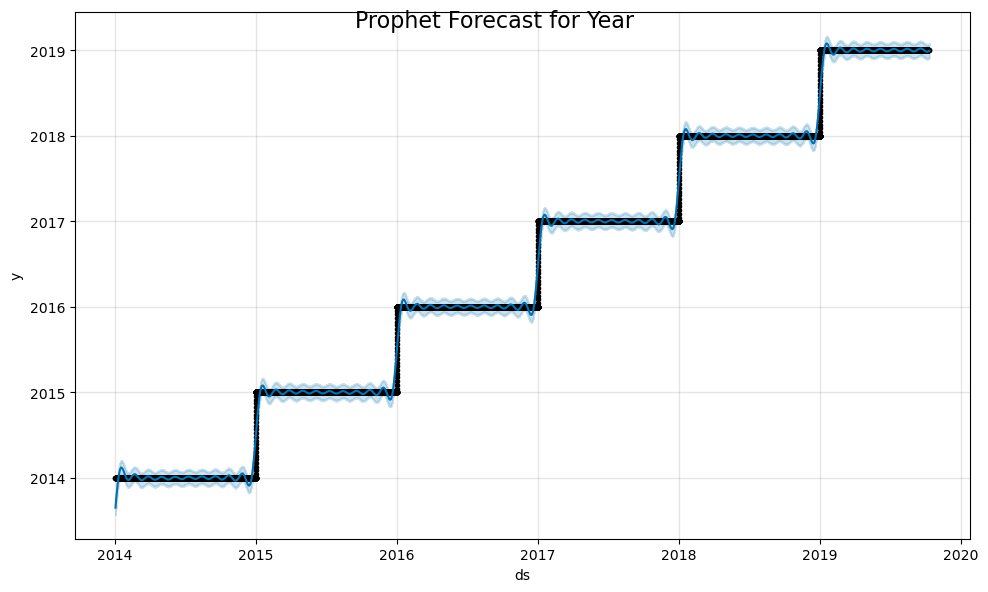

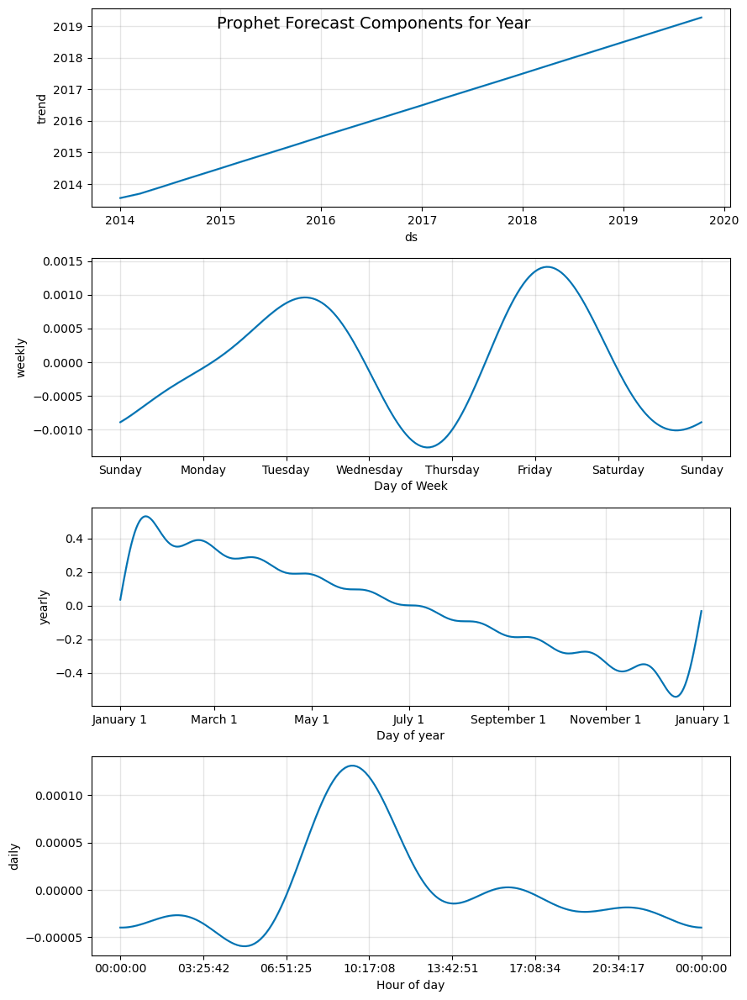

09:38:59 - cmdstanpy - INFO - Chain [1] start processing
09:39:11 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


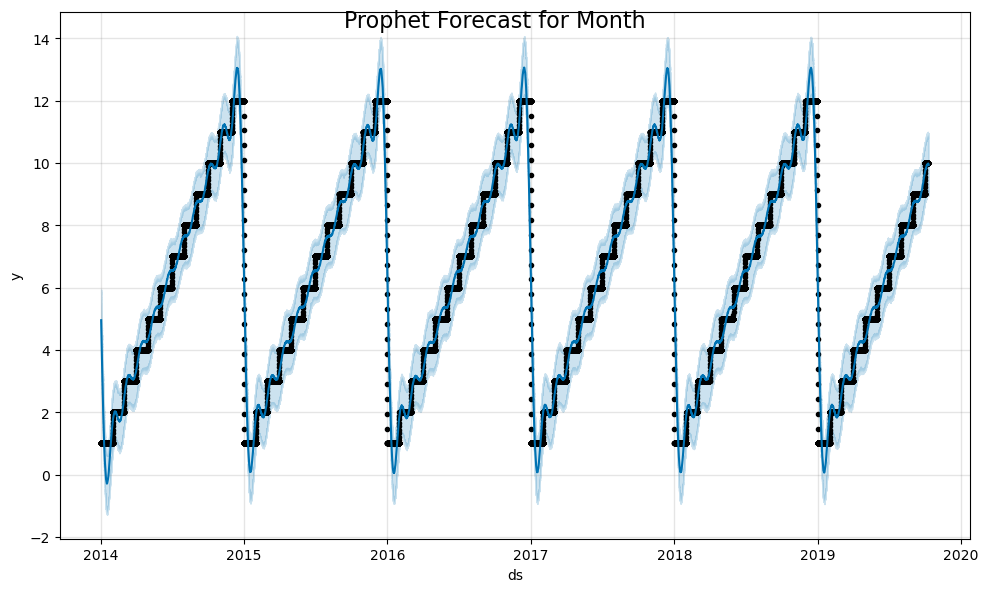

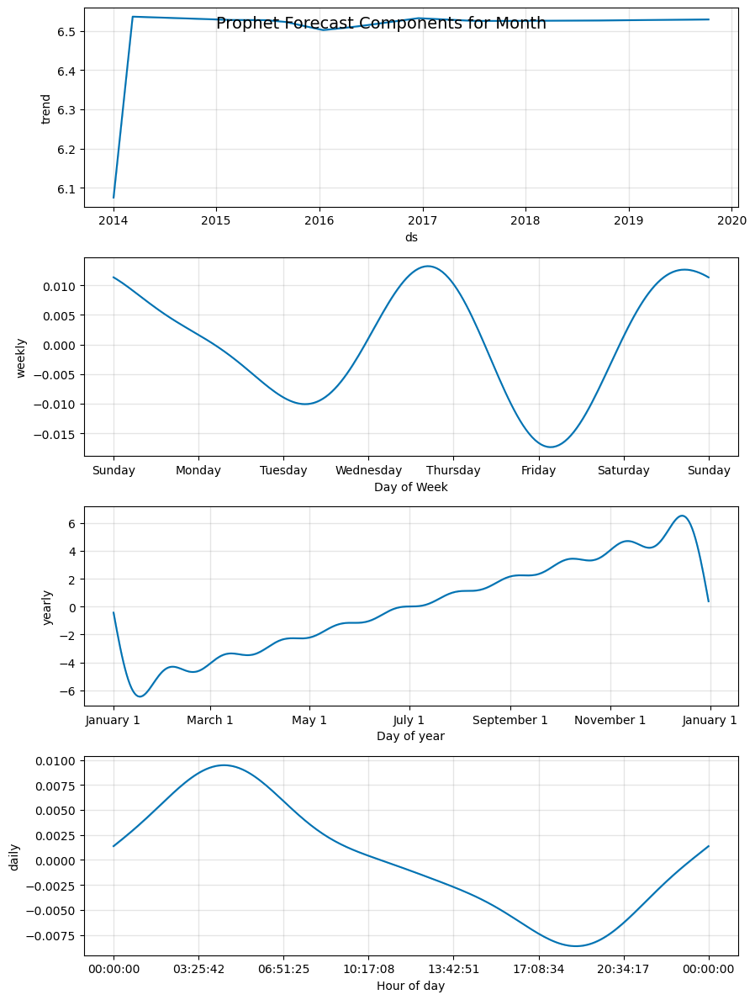

09:39:17 - cmdstanpy - INFO - Chain [1] start processing
09:39:24 - cmdstanpy - INFO - Chain [1] done processing
C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\prophet\forecaster.py:1854: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  dates = pd.date_range(


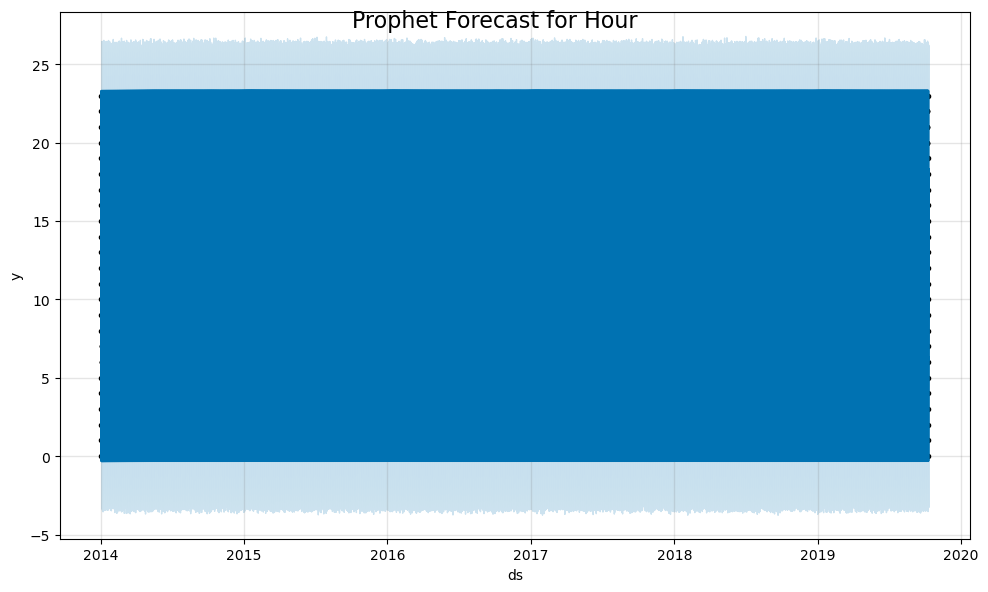

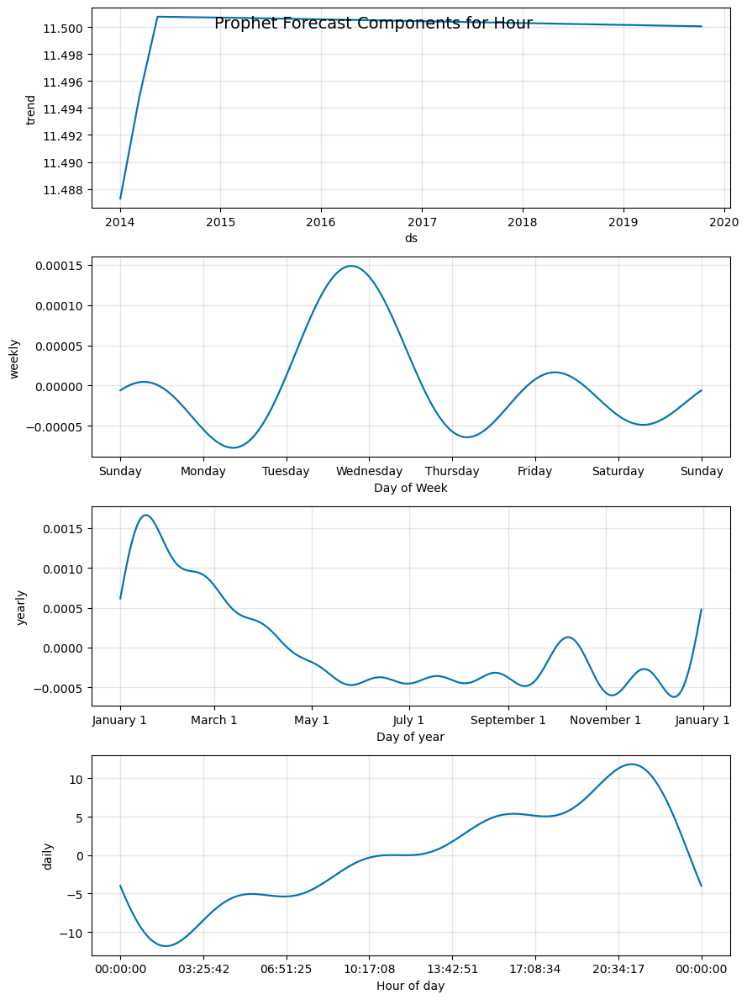

Skipping Weekday Name: not enough data for Prophet model.


In [43]:
# Load and prepare data
df_saleshourly['datum'] = pd.to_datetime(df_saleshourly['datum'], errors='coerce')
df_saleshourly.dropna(subset=['datum'], inplace=True)
df_saleshourly.set_index('datum', inplace=True)

drugs_columns = df_saleshourly.columns.tolist()

# --- Outlier Detection ---
outliers = {}
for drug in drugs_columns:
    df_series = df_saleshourly[drug].copy()
    df_series = pd.to_numeric(df_series, errors='coerce')
    df_series.dropna(inplace=True)
    if len(df_series) >= 48:  # Minimum 2 full cycles for seasonal_decompose with period=24
        result = seasonal_decompose(df_series, model='additive', period=24)
        resid = result.resid.dropna()
        threshold = 2 * resid.std()
        outlier_points = resid[np.abs(resid) > threshold]
        outliers[drug] = outlier_points
    else:
        outliers[drug] = pd.Series(dtype='float64')

# Remove outliers from copy
df_saleshourly_clean = df_saleshourly.copy()
for drug, points in outliers.items():
    if not points.empty:
        df_saleshourly_clean.loc[points.index, drug] = np.nan

df_saleshourly_clean.interpolate(method='linear', inplace=True)

# --- Prophet Forecast ---
for drug in drugs_columns:
    df_prophet = df_saleshourly_clean[[drug]].reset_index().rename(columns={'datum': 'ds', drug: 'y'})
    df_prophet.dropna(inplace=True)
    df_prophet['y'] = pd.to_numeric(df_prophet['y'], errors='coerce')
    df_prophet.dropna(inplace=True)
    
    if len(df_prophet) < 2:
        print(f"Skipping {drug}: not enough data for Prophet model.")
        continue

    model = Prophet()
    model.fit(df_prophet)
    future = model.make_future_dataframe(periods=48, freq='H')
    forecast = model.predict(future)
    fig1 = model.plot(forecast)
    fig1.suptitle(f"Prophet Forecast for {drug}", fontsize=16)
    fig2 = model.plot_components(forecast)
    fig2.suptitle(f"Prophet Forecast Components for {drug}", fontsize=14)
    plt.show()

In [116]:
df_salesdaily = pd.read_csv(r"C:\Users\Rahul's PC\Desktop\MYDOCS\Projects\Pharma_Sales_Analysis\Pharma_Sales_Dataset\salesdaily.csv")
df_salesdaily

,datum,M01AB,M01AE,N02BA,N02BE,N05B,N05C,R03,R06,Year,Month,Hour,Weekday Name
0,1/2/2014,0.00,3.670,3.40,32.40,7.0,0.0,0.0,2.00,2014,1,248,Thursday
1,1/3/2014,8.00,4.000,4.40,50.60,16.0,0.0,20.0,4.00,2014,1,276,Friday
2,1/4/2014,2.00,1.000,6.50,61.85,10.0,0.0,9.0,1.00,2014,1,276,Saturday
3,1/5/2014,4.00,3.000,7.00,41.10,8.0,0.0,3.0,0.00,2014,1,276,Sunday
4,1/6/2014,5.00,1.000,4.50,21.70,16.0,2.0,6.0,2.00,2014,1,276,Monday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2101,10/4/2019,7.34,5.683,2.25,22.45,13.0,0.0,1.0,1.00,2019,10,276,Friday
2102,10/5/2019,3.84,5.010,6.00,25.40,7.0,0.0,0.0,0.33,2019,10,276,Saturday
2103,10/6/2019,4.00,11.690,2.00,34.60,6.0,0.0,5.0,4.20,2019,10,276,Sunday
2104,10/7/2019,7.34,4.507,3.00,50.80,6.0,0.0,10.0,1.00,2019,10,276,Monday


In [117]:
print("Column names:", df_salesdaily.columns.tolist())

Column names: ['datum', 'M01AB', 'M01AE', 'N02BA', 'N02BE', 'N05B', 'N05C', 'R03', 'R06', 'Year', 'Month', 'Hour', 'Weekday Name']


R06 — rows after processing: 2082
count    2082.000000
mean        2.916243
std         2.421935
min         0.000000
25%         1.000000
50%         2.000000
75%         4.000000
max        15.000000
Name: R06, dtype: float64
parsed_date
2014-01-26    0.0
2014-01-27    3.0
2014-01-28    5.0
2014-01-29    2.0
2014-01-30    2.0
2014-01-31    0.0
2014-02-01    0.0
2014-02-02    0.0
2014-02-03    0.0
2014-02-04    2.0
Name: R06, dtype: float64


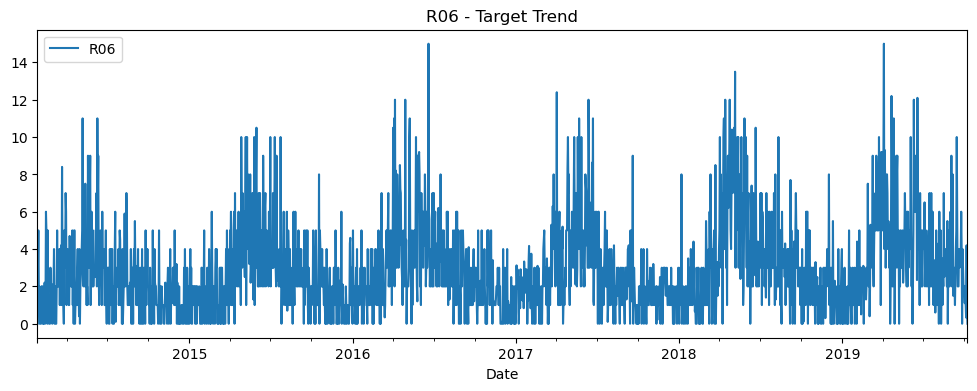

In [122]:
# Save date column separately before stripping
original_dates = df_salesdaily['datum'].copy()

# Apply strip only to non-'datum' columns
df_salesdaily.columns = [col.strip() if col.strip().lower() != 'datum' else col for col in df_salesdaily.columns]

# Parse and set the index using preserved original_dates
original_dates = pd.to_datetime(original_dates, errors='coerce')
df_salesdaily['parsed_date'] = original_dates

# Reassign correct datetime to ensure plot compatibility
parsed_dates_df = df_salesdaily[['parsed_date']].copy()
df_salesdaily.set_index('parsed_date', inplace=True)
df_salesdaily = df_salesdaily[~df_salesdaily.index.isna()]  # Remove rows where index is NaT after coercion
df_salesdaily_1 = df_salesdaily.drop(columns=['Year', 'Month', 'Hour', 'Weekday Name'])
drugs_columns = df_salesdaily_1.columns.tolist()

# --- Feature Engineering ---
processed_drugs = {}
for drug in drugs_columns:
    df_ml = df_salesdaily[[drug]].copy()
    df_ml.index = pd.to_datetime(df_ml.index)
    df_ml[drug] = pd.to_numeric(df_ml[drug], errors='coerce')
    df_ml['hour'] = df_ml.index.hour
    df_ml['day'] = df_ml.index.day
    df_ml['weekday'] = df_ml.index.weekday
    df_ml['month'] = df_ml.index.month
    df_ml['year'] = df_ml.index.year
    for lag in range(1, 25):
        df_ml[f'lag_{lag}'] = df_ml[drug].shift(lag)
    df_ml['rolling_mean_3'] = df_ml[drug].rolling(3).mean()
    df_ml['rolling_std_3'] = df_ml[drug].rolling(3).std()
    df_ml.dropna(inplace=True)
    processed_drugs[drug] = df_ml

# Preview and plot one drug for diagnostics
df_ml = processed_drugs[drug]
print(f"{drug} — rows after processing: {len(df_ml)}")
print(df_ml[drug].describe())
print(df_ml[drug].head(10))

# Add parsed_date for plotting explicitly
df_ml_plot = df_ml.copy()
df_ml_plot['parsed_date'] = df_ml_plot.index
df_ml_plot.plot(x='parsed_date', y=drug, title=f"{drug} - Target Trend", figsize=(12, 4))
plt.xlabel("Date")
plt.show()


Skipping datum due to insufficient non-zero data (0 rows)
Fitting 5 folds for each of 81 candidates, totalling 405 fits


C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Fitting 5 folds for each of 81 candidates, totalling 405 fits


C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Fitting 5 folds for each of 81 candidates, totalling 405 fits


C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Fitting 5 folds for each of 81 candidates, totalling 405 fits


C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Fitting 5 folds for each of 81 candidates, totalling 405 fits


C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Fitting 5 folds for each of 81 candidates, totalling 405 fits


C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Fitting 5 folds for each of 81 candidates, totalling 405 fits


C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


Fitting 5 folds for each of 81 candidates, totalling 405 fits
M01AB — MAE: 0.63, RMSE: 1.06, R²: 0.85


C:\Users\Rahul's PC\AppData\Roaming\Python\Python312\site-packages\sklearn\metrics\_regression.py:492: FutureWarning: 'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.
  warnings.warn(


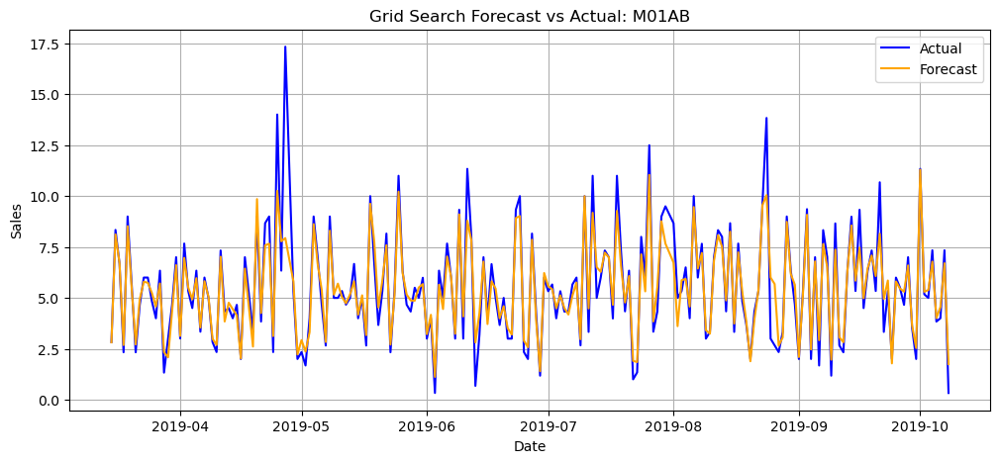

M01AE — MAE: 0.40, RMSE: 0.55, R²: 0.92


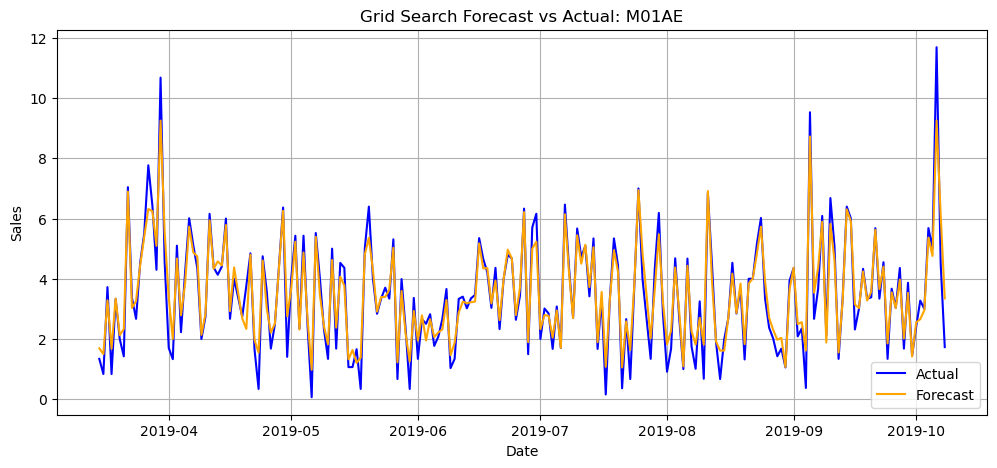

N02BA — MAE: 0.40, RMSE: 0.56, R²: 0.89


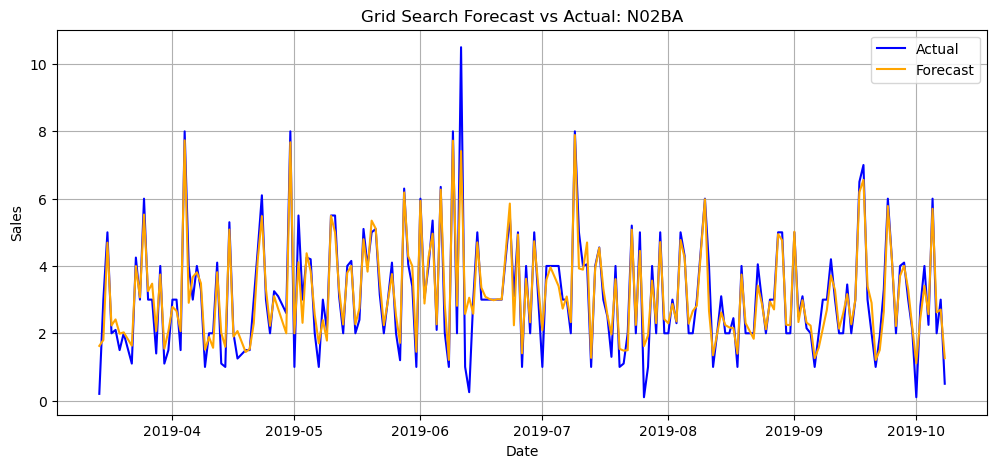

N02BE — MAE: 2.23, RMSE: 2.93, R²: 0.93


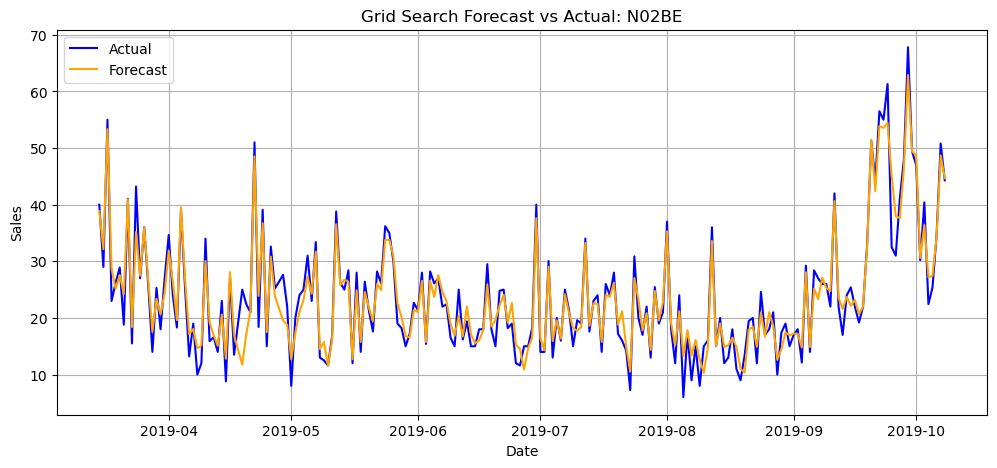

N05B — MAE: 0.80, RMSE: 1.08, R²: 0.93


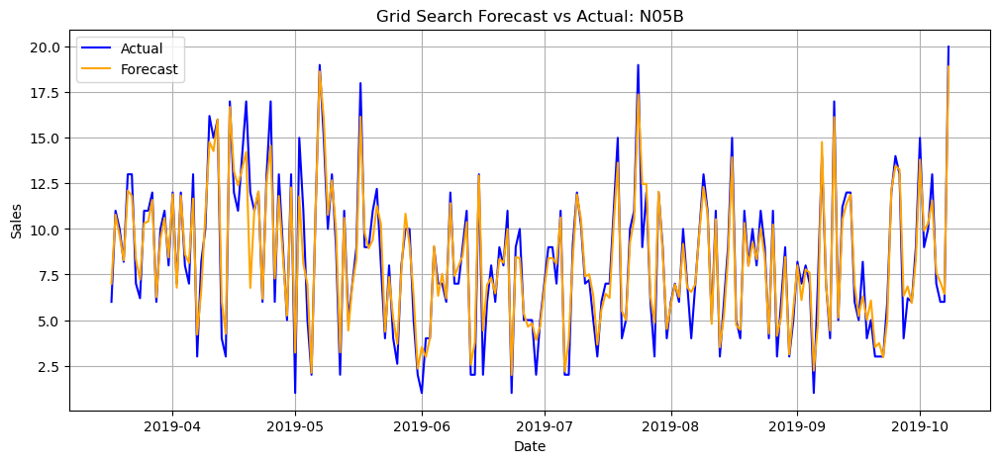

N05C — MAE: 0.13, RMSE: 0.26, R²: 0.95


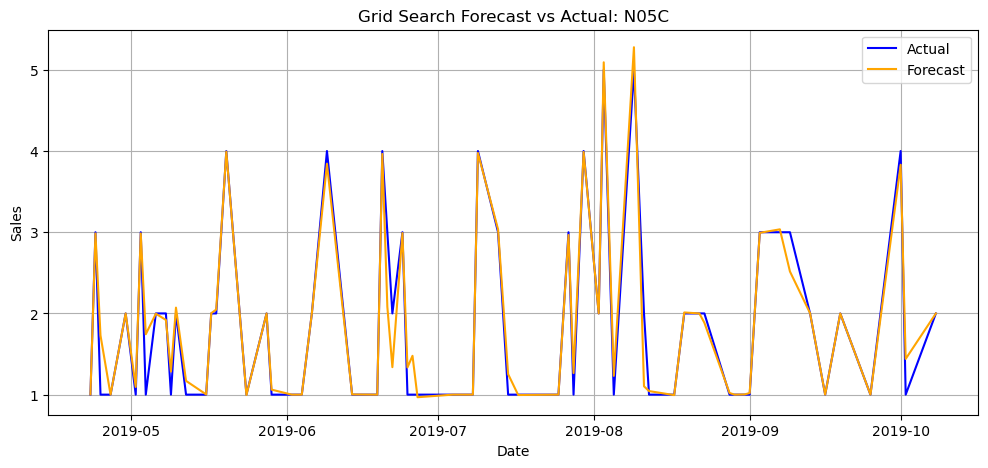

R03 — MAE: 1.33, RMSE: 2.49, R²: 0.87


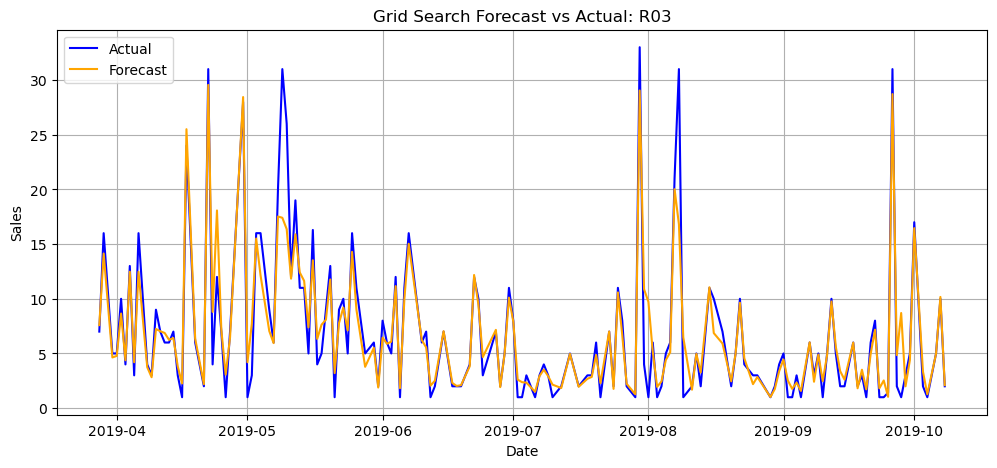

R06 — MAE: 0.56, RMSE: 0.98, R²: 0.85


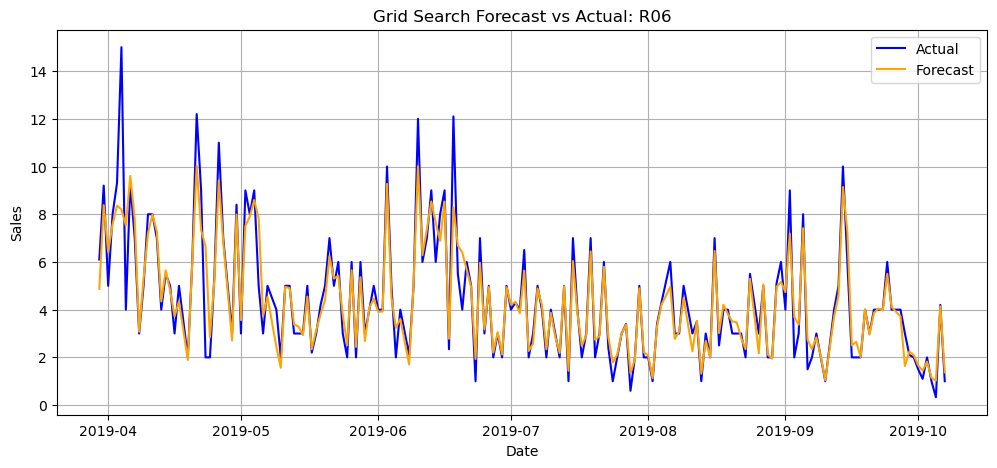

In [126]:
# --- ML Model (Random Forest + GridSearchCV) ---
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [4, 8, 12],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

results_gs = {}
for drug, df_ml in processed_drugs.items():
    df_ml = df_ml.dropna().copy()
    df_ml_filtered = df_ml[df_ml[drug] > 0].copy()

    if len(df_ml_filtered) <= 100:
        print(f"Skipping {drug} due to insufficient non-zero data ({len(df_ml_filtered)} rows)")
        continue

    X = df_ml_filtered.drop(columns=[drug])
    y = df_ml_filtered[drug]
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=False)

    rf = RandomForestRegressor(random_state=42)
    grid_search = GridSearchCV(rf, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1, verbose=1)
    grid_search.fit(X_train, y_train)
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    results_gs[drug] = {
        'y_test': y_test,
        'y_pred': y_pred,
        'index': y_test.index,
        'mae': mean_absolute_error(y_test, y_pred),
        'rmse': mean_squared_error(y_test, y_pred, squared=False),
        'r2': r2_score(y_test, y_pred),
        'best_params': grid_search.best_params_
    }

# --- Plot GridSearch Results ---
for drug, res in results_gs.items():
    print(f"{drug} — MAE: {res['mae']:.2f}, RMSE: {res['rmse']:.2f}, R²: {res['r2']:.2f}")
    
    date_range = res['index']
    plt.figure(figsize=(12, 5))
    plt.plot(date_range, res['y_test'], label='Actual', color='blue')
    plt.plot(date_range, res['y_pred'], label='Forecast', color='orange')
    plt.title(f"Grid Search Forecast vs Actual: {drug}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()

Skipping datum due to insufficient data
M01AB — R2 Score: 0.87


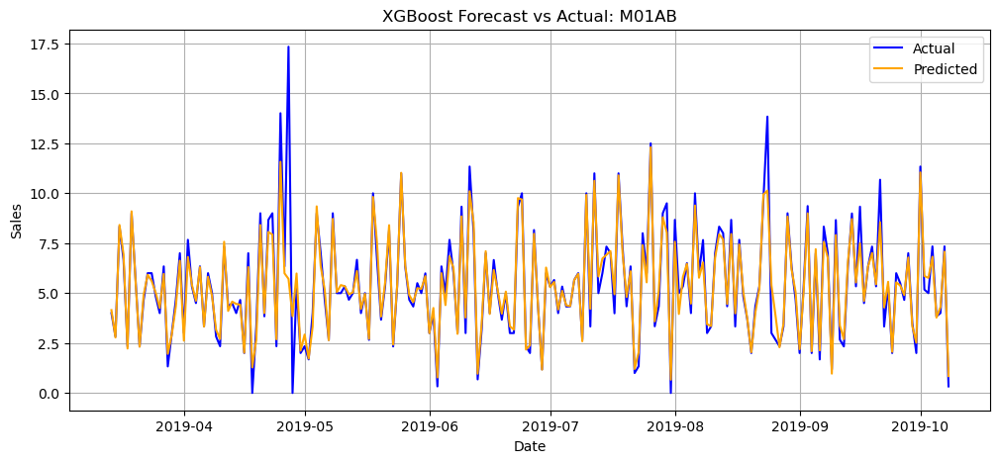

M01AE — R2 Score: 0.97


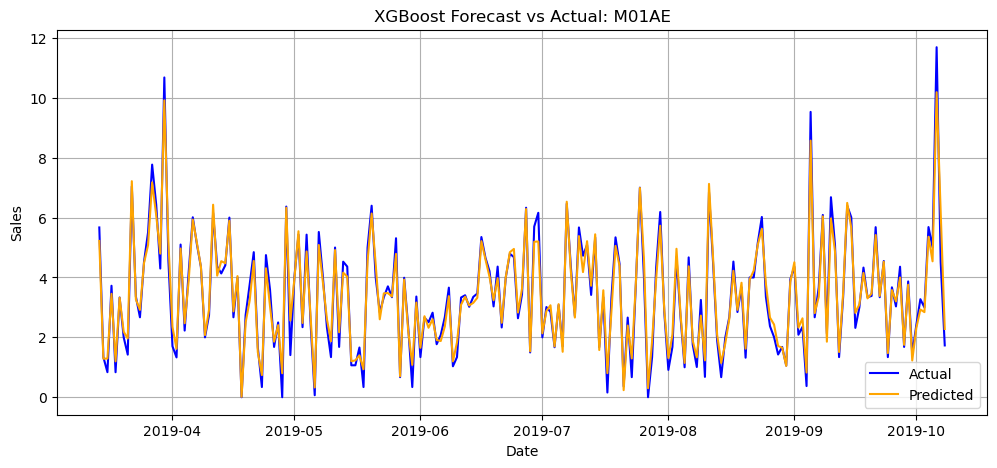

N02BA — R2 Score: 0.96


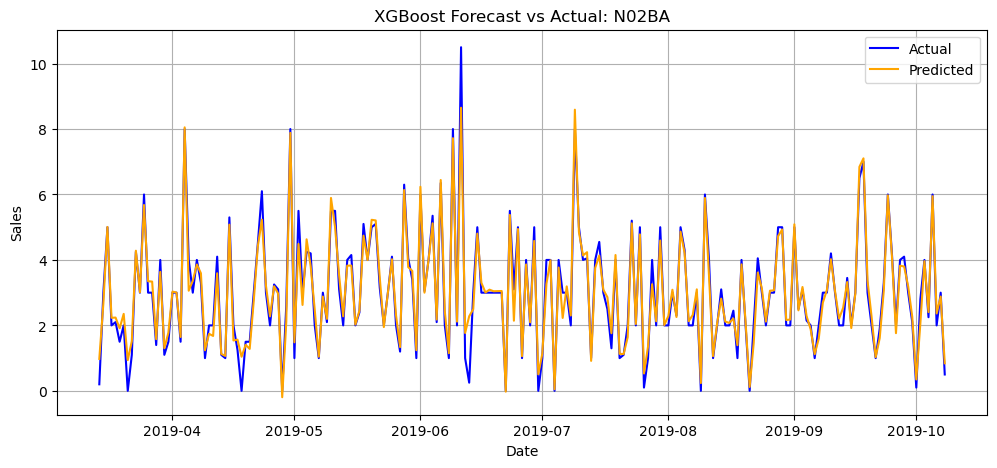

N02BE — R2 Score: 0.97


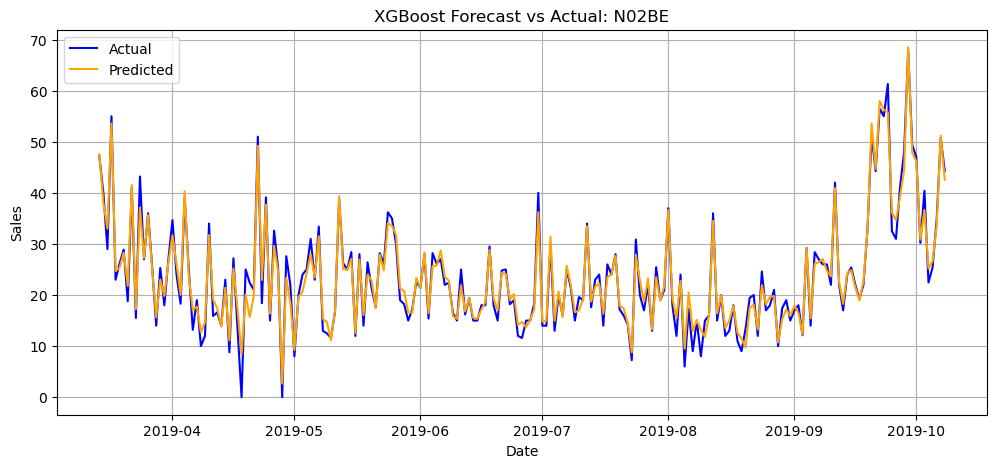

N05B — R2 Score: 0.97


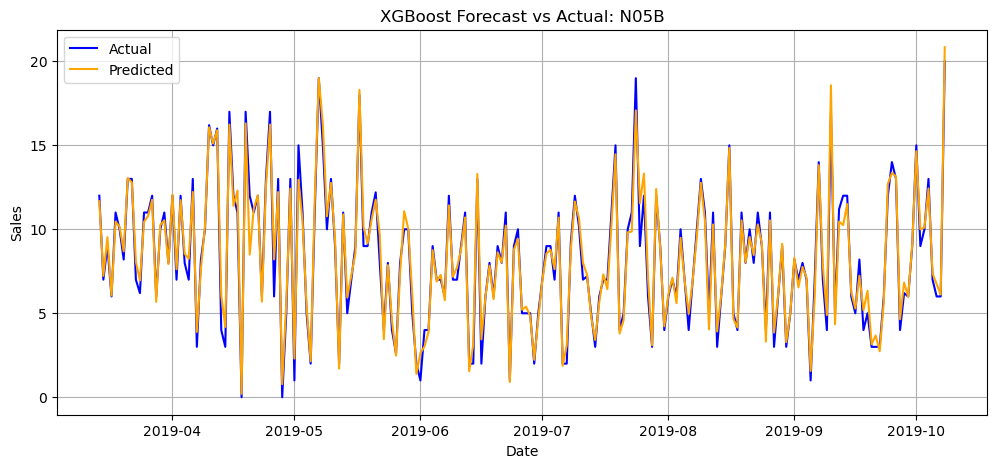

N05C — R2 Score: 0.97


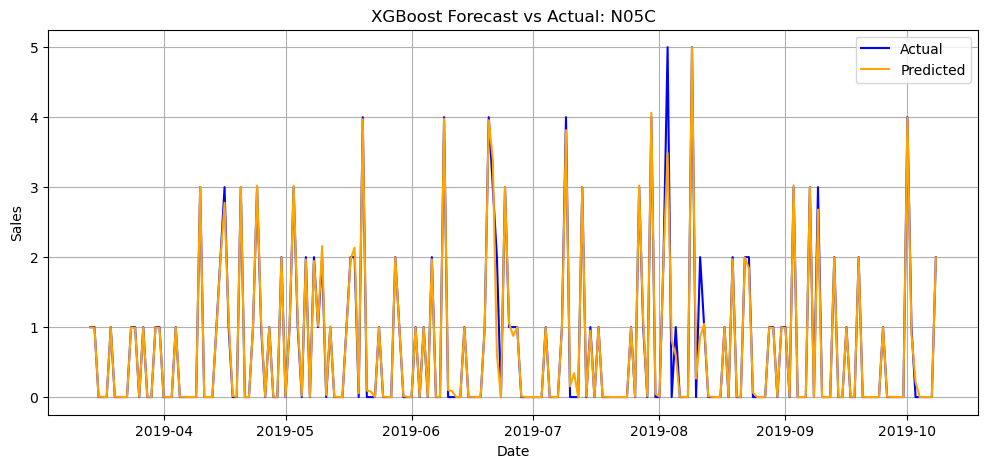

R03 — R2 Score: 0.96


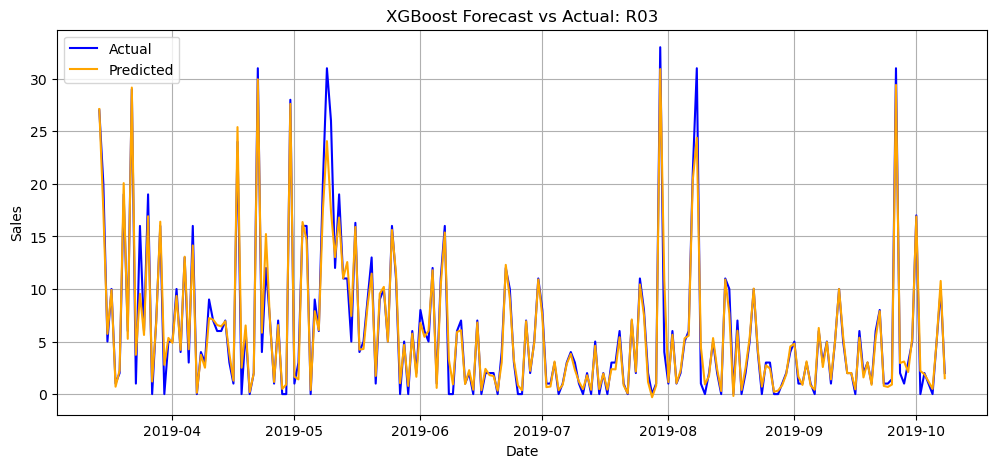

R06 — R2 Score: 0.92


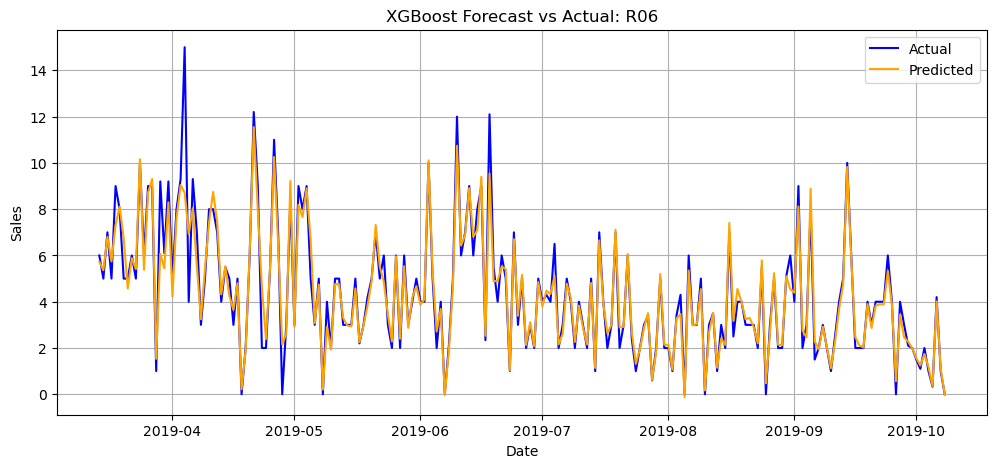

In [160]:
# Save date column separately before stripping
original_dates = df_salesdaily['datum'].copy()

# Apply strip only to non-'datum' columns
df_salesdaily.columns = [col.strip() if col.strip().lower() != 'datum' else col for col in df_salesdaily.columns]

# Parse and set the index using preserved original_dates
original_dates = pd.to_datetime(original_dates, errors='coerce')
df_salesdaily['parsed_date'] = original_dates

# Reassign correct datetime to ensure plot compatibility
parsed_dates_df = df_salesdaily[['parsed_date']].copy()
df_salesdaily.set_index('parsed_date', inplace=True)
df_salesdaily = df_salesdaily[~df_salesdaily.index.isna()]  # Remove rows where index is NaT after coercion
df_salesdaily_1 = df_salesdaily.drop(columns=['Year', 'Month', 'Hour', 'Weekday Name'])
drugs_columns = df_salesdaily_1.columns.tolist()

# --- Feature Engineering ---
processed_drugs = {}
for drug in drugs_columns:
    df_ml = df_salesdaily[[drug]].copy()
    df_ml.index = pd.to_datetime(df_ml.index)
    df_ml[drug] = pd.to_numeric(df_ml[drug], errors='coerce')
    df_ml['hour'] = df_ml.index.hour
    df_ml['day'] = df_ml.index.day
    df_ml['weekday'] = df_ml.index.weekday
    df_ml['month'] = df_ml.index.month
    df_ml['year'] = df_ml.index.year
    for lag in range(1, 25):
        df_ml[f'lag_{lag}'] = df_ml[drug].shift(lag)
    df_ml['rolling_mean_3'] = df_ml[drug].rolling(3).mean()
    df_ml['rolling_std_3'] = df_ml[drug].rolling(3).std()
    df_ml.dropna(inplace=True)
    processed_drugs[drug] = df_ml

# Switch to XGBoost model
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Apply XGBoost across all drugs and plot results
for drug, df_ml in processed_drugs.items():
    X = df_ml.drop(columns=[drug])
    y = df_ml[drug]

    if len(df_ml) < 10:
        print(f"Skipping {drug} due to insufficient data")
        continue

    try:
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, shuffle=False)
    except ValueError as e:
        print(f"Skipping {drug} due to error: {e}")
        continue

    model = XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=5, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    print(f"{drug} — R2 Score: {r2_score(y_test, y_pred):.2f}")

    # Plot Actual vs Predicted
    plt.figure(figsize=(12, 5))
    plt.plot(y_test.index, y_test.values, label='Actual', color='blue')
    plt.plot(y_test.index, y_pred, label='Predicted', color='orange')
    plt.title(f"XGBoost Forecast vs Actual: {drug}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()


16:22:24 - cmdstanpy - INFO - Chain [1] start processing
16:22:24 - cmdstanpy - INFO - Chain [1] done processing


Skipping datum due to insufficient data


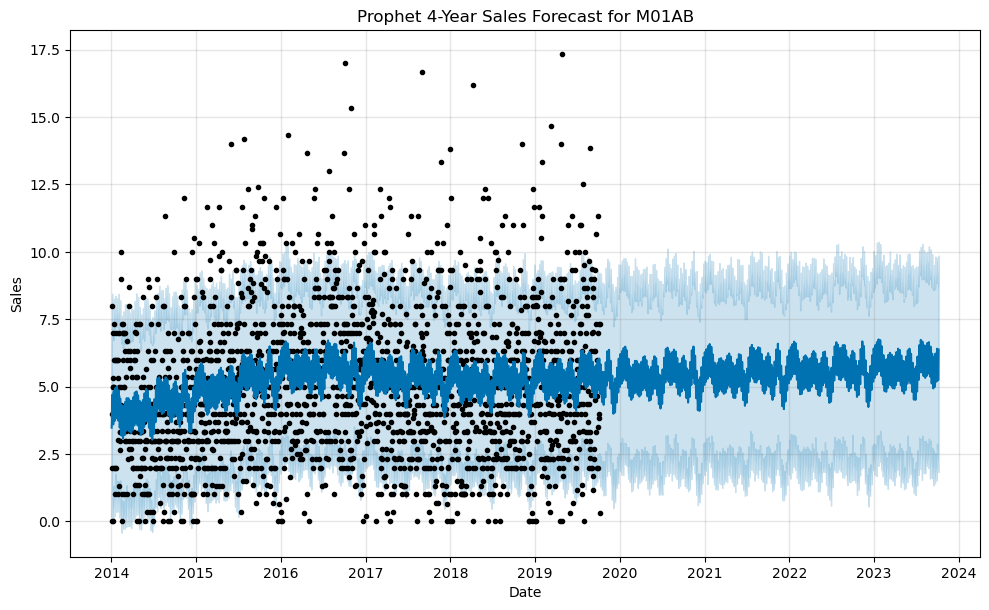

16:22:25 - cmdstanpy - INFO - Chain [1] start processing
16:22:25 - cmdstanpy - INFO - Chain [1] done processing


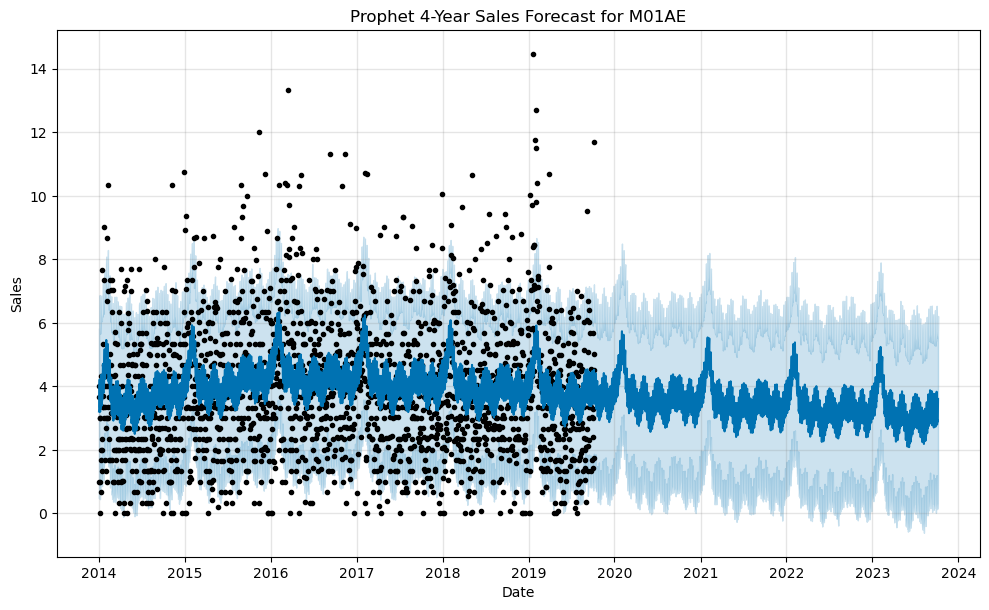

16:22:26 - cmdstanpy - INFO - Chain [1] start processing
16:22:26 - cmdstanpy - INFO - Chain [1] done processing


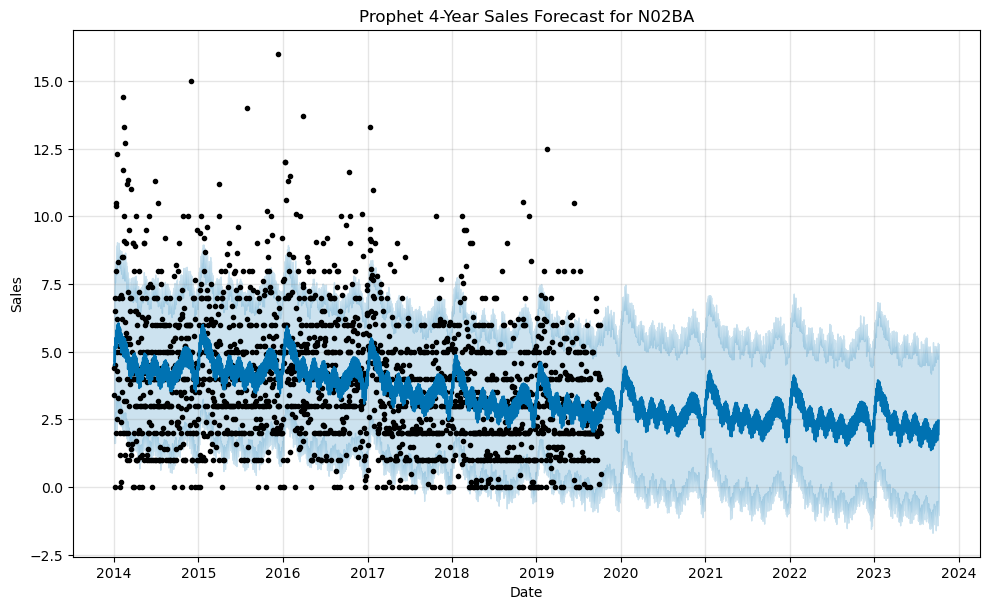

16:22:26 - cmdstanpy - INFO - Chain [1] start processing
16:22:27 - cmdstanpy - INFO - Chain [1] done processing


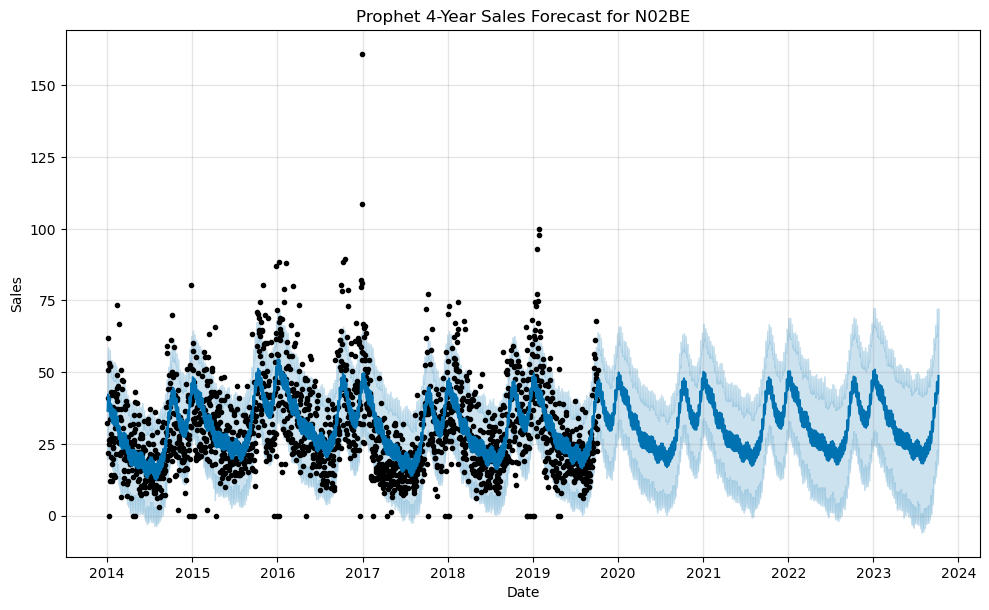

16:22:27 - cmdstanpy - INFO - Chain [1] start processing
16:22:27 - cmdstanpy - INFO - Chain [1] done processing


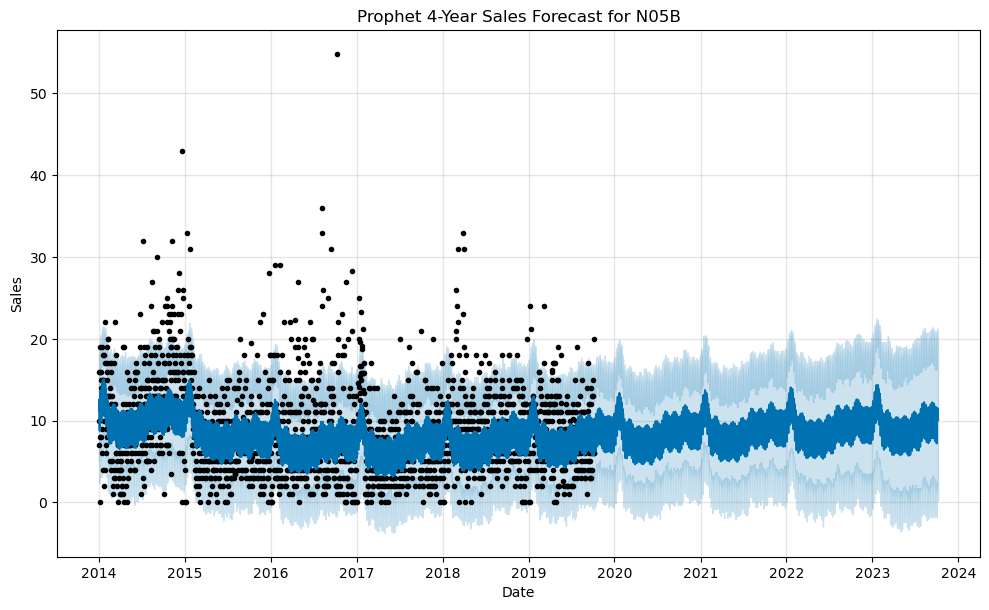

16:22:28 - cmdstanpy - INFO - Chain [1] start processing
16:22:28 - cmdstanpy - INFO - Chain [1] done processing


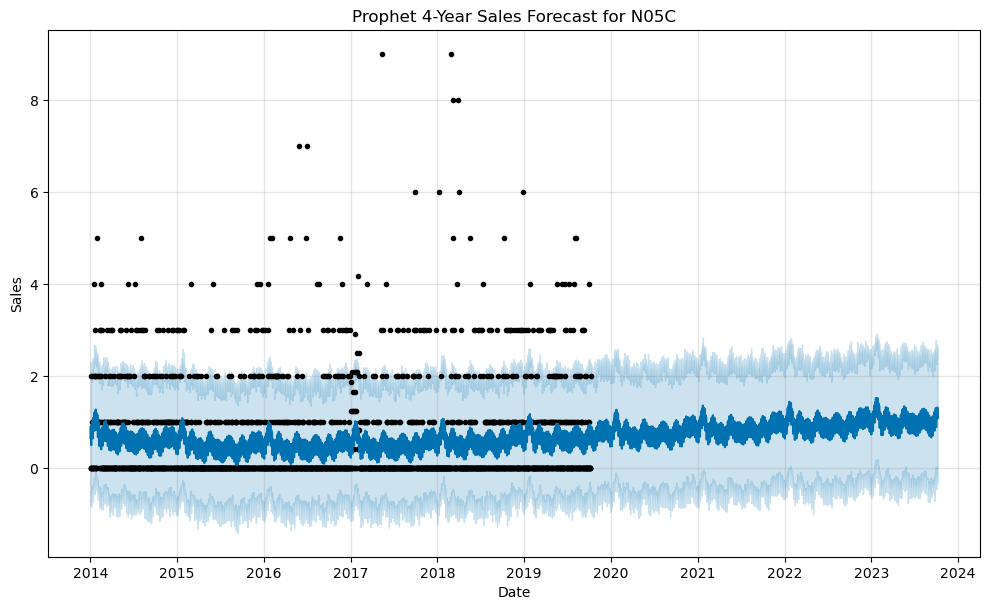

16:22:29 - cmdstanpy - INFO - Chain [1] start processing
16:22:29 - cmdstanpy - INFO - Chain [1] done processing


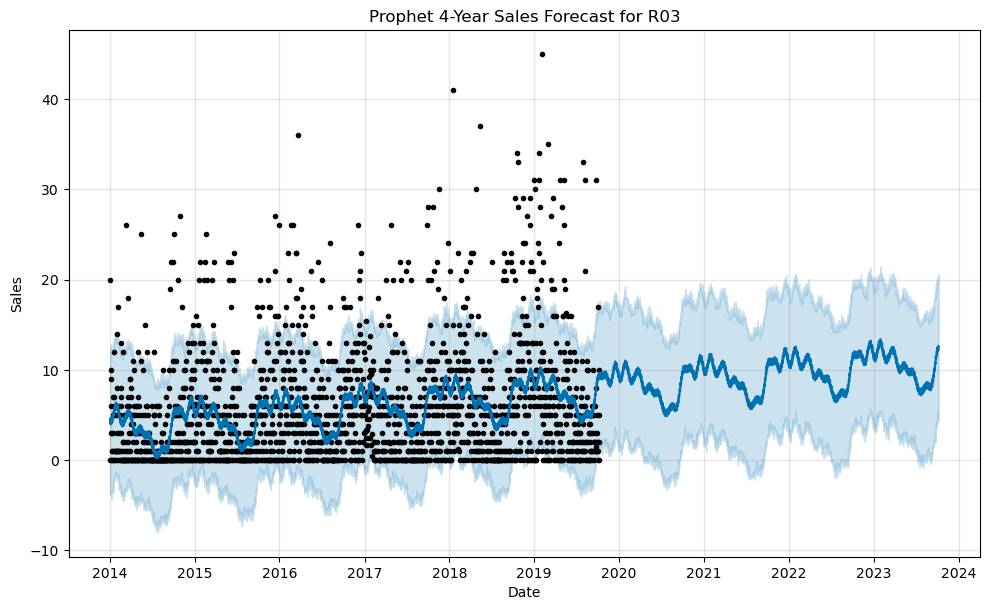

16:22:29 - cmdstanpy - INFO - Chain [1] start processing
16:22:30 - cmdstanpy - INFO - Chain [1] done processing


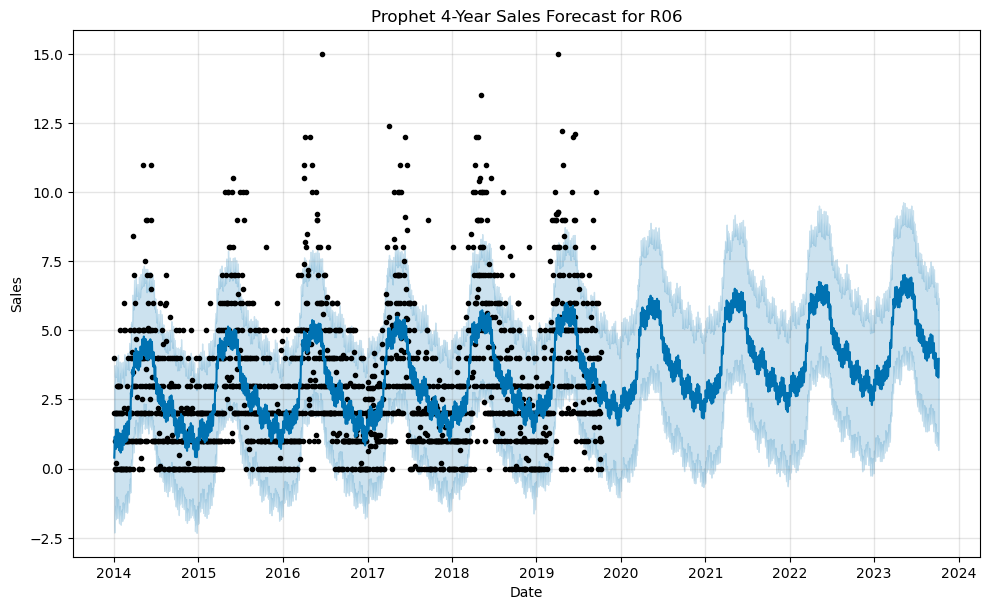

In [161]:
# Save date column separately before stripping
original_dates = df_salesdaily['datum'].copy()

# Apply strip only to non-'datum' columns
df_salesdaily.columns = [col.strip() if col.strip().lower() != 'datum' else col for col in df_salesdaily.columns]

# Parse and set the index using preserved original_dates
original_dates = pd.to_datetime(original_dates, errors='coerce')
df_salesdaily['parsed_date'] = original_dates

# Reassign correct datetime to ensure plot compatibility
parsed_dates_df = df_salesdaily[['parsed_date']].copy()
df_salesdaily.set_index('parsed_date', inplace=True)
df_salesdaily = df_salesdaily[~df_salesdaily.index.isna()]  # Remove rows where index is NaT after coercion
df_salesdaily_1 = df_salesdaily.drop(columns=['Year', 'Month', 'Hour', 'Weekday Name'])
drugs_columns = df_salesdaily_1.columns.tolist()

from prophet import Prophet

for drug in drugs_columns:
    df_prophet = df_salesdaily[[drug]].copy()
    df_prophet = df_prophet.reset_index()
    df_prophet.columns = ['ds', 'y']
    df_prophet['y'] = pd.to_numeric(df_prophet['y'], errors='coerce')
    df_prophet.dropna(inplace=True)

    if len(df_prophet) < 100:
        print(f"Skipping {drug} due to insufficient data")
        continue

    model = Prophet(daily_seasonality=True, yearly_seasonality=True)
    model.fit(df_prophet)

    future = model.make_future_dataframe(periods=1460)
    forecast = model.predict(future)

    # Plot forecast
    fig = model.plot(forecast)
    plt.title(f"Prophet 4-Year Sales Forecast for {drug}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.grid(True)
    plt.show()


16:29:42 - cmdstanpy - INFO - Chain [1] start processing
16:29:42 - cmdstanpy - INFO - Chain [1] done processing


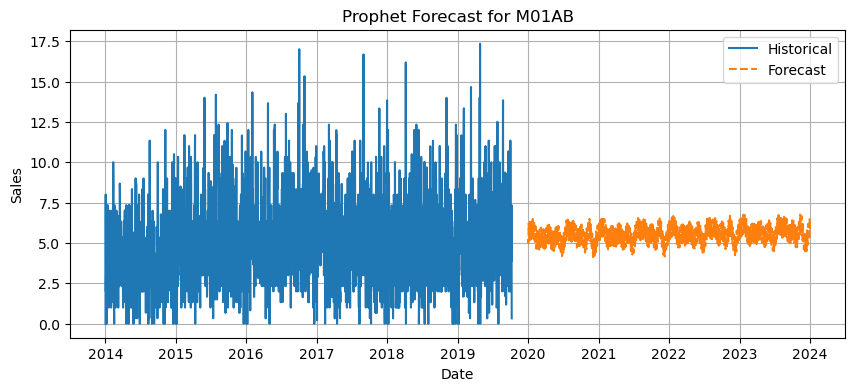

16:29:43 - cmdstanpy - INFO - Chain [1] start processing
16:29:43 - cmdstanpy - INFO - Chain [1] done processing


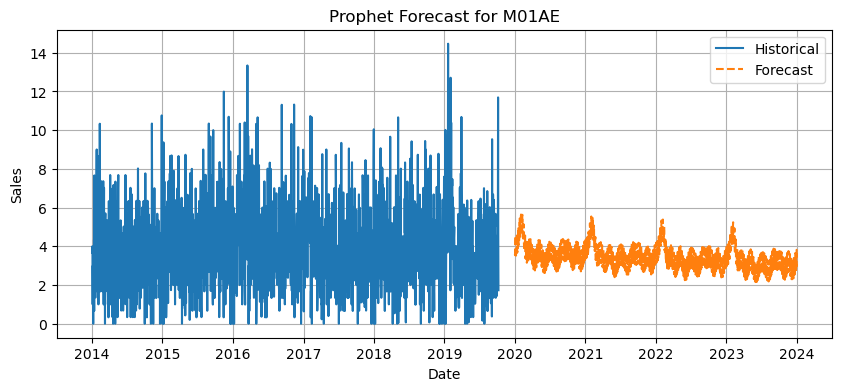

16:29:43 - cmdstanpy - INFO - Chain [1] start processing
16:29:43 - cmdstanpy - INFO - Chain [1] done processing


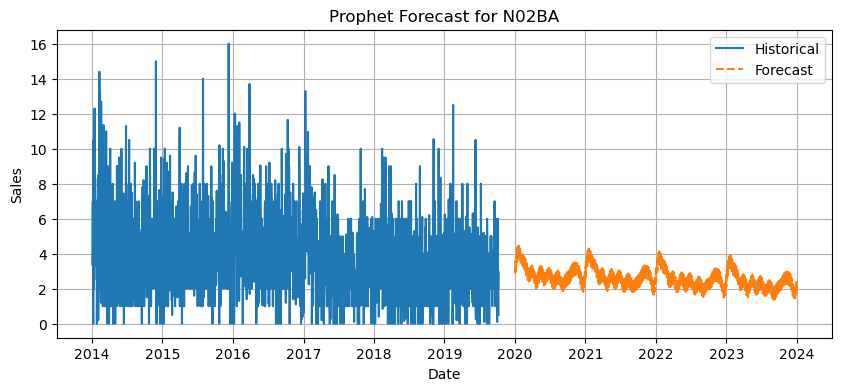

16:29:44 - cmdstanpy - INFO - Chain [1] start processing
16:29:44 - cmdstanpy - INFO - Chain [1] done processing


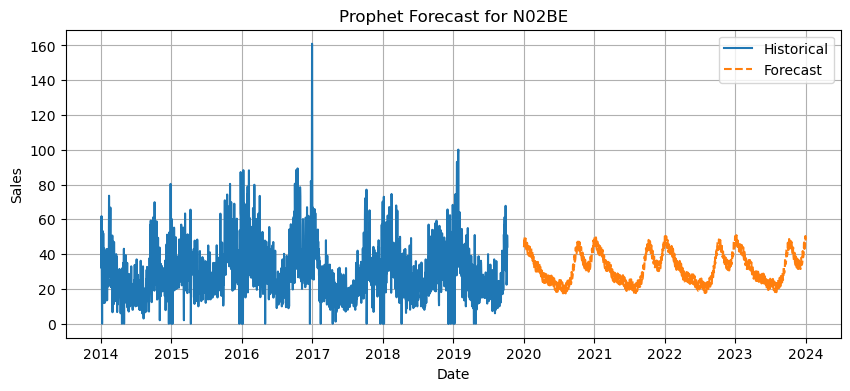

16:29:44 - cmdstanpy - INFO - Chain [1] start processing
16:29:44 - cmdstanpy - INFO - Chain [1] done processing


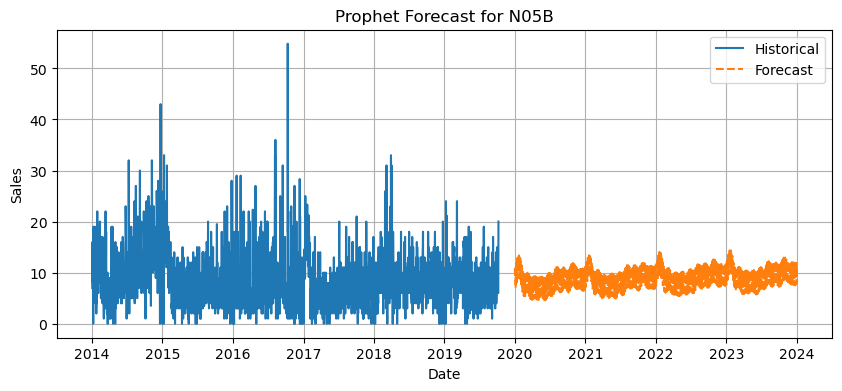

16:29:45 - cmdstanpy - INFO - Chain [1] start processing
16:29:45 - cmdstanpy - INFO - Chain [1] done processing


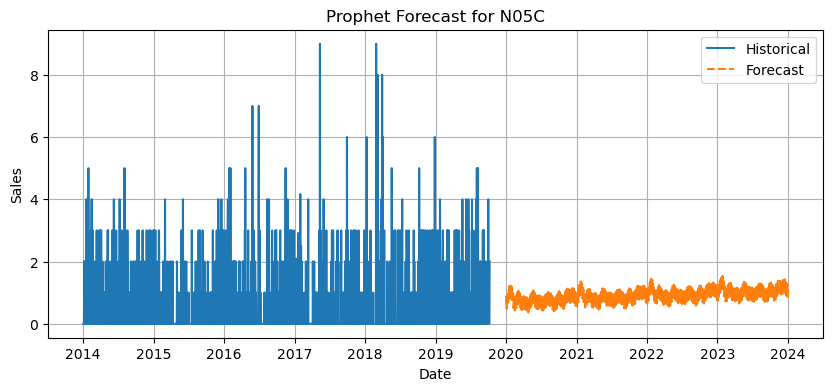

16:29:45 - cmdstanpy - INFO - Chain [1] start processing
16:29:45 - cmdstanpy - INFO - Chain [1] done processing


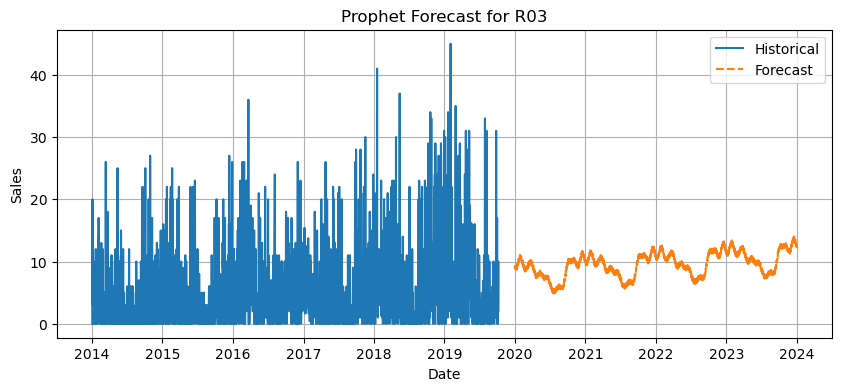

16:29:46 - cmdstanpy - INFO - Chain [1] start processing
16:29:46 - cmdstanpy - INFO - Chain [1] done processing


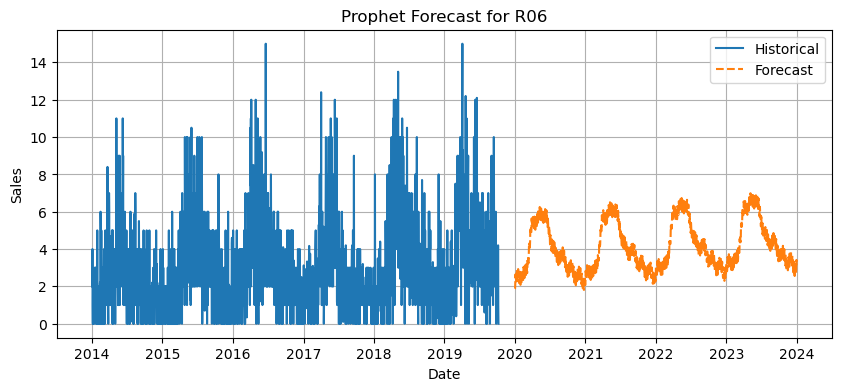

In [164]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt

# Load and prepare your data
drugs_columns = [col for col in drugs_columns if col != 'datum']

df = df_salesdaily[['datum'] + drugs_columns].copy()
df['datum'] = pd.to_datetime(df['datum'])
df = df.dropna()

# Create new date range for future forecast
future_dates = pd.date_range(start='2020-01-01', end='2024-01-01', freq='D')
forecast_results = pd.DataFrame({'ds': future_dates})

# Container for all predictions
prophet_forecasts = pd.DataFrame({'ds': future_dates})

for drug in drugs_columns:
    df_prophet = df[['datum', drug]].rename(columns={'datum': 'ds', drug: 'y'})

    # Skip drug if not enough data
    if len(df_prophet) < 100:
        print(f"Skipping {drug} due to insufficient data")
        continue

    # Fit Prophet model
    model = Prophet(daily_seasonality=True)
    model.fit(df_prophet)

    # Predict future
    forecast = model.predict(forecast_results)
    prophet_forecasts[drug] = forecast['yhat'].values

    # Optional: plot
    plt.figure(figsize=(10, 4))
    plt.plot(df_prophet['ds'], df_prophet['y'], label='Historical')
    plt.plot(forecast['ds'], forecast['yhat'], label='Forecast', linestyle='--')
    plt.title(f"Prophet Forecast for {drug}")
    plt.xlabel("Date")
    plt.ylabel("Sales")
    plt.legend()
    plt.grid(True)
    plt.show()

# Save forecast to CSV
prophet_forecasts.to_csv("prophet_forecast_2020_2024.csv", index=False)
